<a href="https://colab.research.google.com/github/mkunyosi/FLAI/blob/learning/DDS9/DDS9_EDA_fim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FLAI - 9ª Competição de Machine Learning
Módulo EDA


> *Sorte é o que acontece quando a preparação encontra a oportunidade - Elmer Letterman*


Neste notebook é apresentada a análise exploratória dos dados (EDA) da 9ª Competição de Machine Learning da FLAI.

O código de machine learning foi separada e está em outro notebook.

As primeiras seções deste notebook, de 1 a 3, contém código comum ao módulo que trata machine learning.

A partir da seção 4 o código é específico para EDA.

Sugiro a leitura do notebook a partir da seção 4. Em cada subseção foram listados comentários sobre as características identificadas.

Em alguns trechos os _insights_ para serem levados para o módulo de machine learning estão identificados com símbolo 💡.

Em outros trecho há o símbolo ❓ para identificar uma dúvida que pode ter sido resolvida em subseções mais a frente.

Para executar o código a partir da seção 4 é necessário, previamente, executar os códigos das seções anteriores (de 1 a 3).

No readme do repositório onde está este notebook há um resumo das observações verificadas e também os _insights_ extraídos.

Este notebook foi desenvolvido e testado apenas no ambiente do Google Colab. 

Como dica, utilize o índice do plataforma Colab para se orientar dentro do notebook.

**Marcos Kunyosi** (julho/2022)


# **1.Initial setup (installs & imports)**

As funções e variáveis desta parte do código também foram usadas no módulo de EDA.

In [1]:
MK_load_ML_modules = False
MK_load_ML_modules_newsetup = False

MK_load_EDA_modules = True
MK_load_EDA_modules_SweetyViz = True
MK_load_EDA_modules_PandasProfiling = True


## Importing PyCaret (new way)

Code below was suggested by Rafael Batista on FLAI community

In [2]:
if MK_load_ML_modules_newsetup == True:
    !pip install pycaret==2.3.10 markupsafe==2.0.1 pyyaml==5.4.1 -qq


## Importing PyCaret (old way)

No Colab, ao rodar a instalação do PyCaret pela primeira vez, sempre ocorre um erro (jun/2022). Para contornar essa situação, eu reinicio o ambiente do Colab e rodo novamente a instalação.

In [3]:
if MK_load_ML_modules == True:
    !pip install pycaret

Entretanto para garantir que o PyCaret carregue todas as bibliotecas é necessário rodar um comando adicional (ver abaixo).

In [4]:
if MK_load_ML_modules == True:
    !pip install markupsafe==2.0.1

## Loading PyCaret functions

In [5]:
if MK_load_ML_modules == True or MK_load_ML_modules_newsetup == True:
    from pycaret.regression import pull, setup, models, create_model, compare_models, tune_model, \
                                get_config, \
                                blend_models, get_config, add_metric, stack_models, \
                                predict_model, plot_model, predict_model, evaluate_model, \
                                finalize_model, save_config, load_config, save_model, load_model

## **Other Installs and imports**


In [6]:
# importing modules
import pandas as pd 
import numpy as np

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

from IPython.display import clear_output

# importing modules for EDA analisys
import seaborn as sn
from scipy import stats
import missingno as msno

import matplotlib.pyplot as plt



# **2.My Funtions**

## **Util Functions - General purpose**

In [7]:
from google.colab import files

def mk_export_file(df, fname, typeOfFile='excel'):
    """
    Export a dataframe or a file to the local machine.
    
    If a dataframe is passed, this function converts data into Excel format
    and export it to local machine.
    
    If a empty dataframe is passed, any file from Google Colab environment 
    would be exported to local machine.

    Parameters
    ----------
    df: dataframe
        as usual used in pandas
    fname: string
        name of the file to be exported
    typeOfFile: string (optional), 'excel' (default), 'cvs', ''
        format of the file to be exported
        '' no format will be applied, file just will be exported from Colad env.

    Returns
    -------
    There is no return. File is downloaded to the local machine

    See Also
    --------    
    .to_excel and .to_csv functions (pandas´s library)    
    .download (google.colab library)

    Examples
    --------
    >>> # downloading a pkl file (stored on Colab)
    >>> mk_export_file([], 'peackle.pkl')

    >>> # downloading a xlsx file (stored on Colab)
    >>> mk_export_file(pred, "ExcelFile.xlsx")    

    >>> # convert a dataframe into a csv file and download it
    >>> mk_export_file(df, 'sub.csv', typeOfFile='csv')  

    >>> # convert a dataframe into a Excel file and download it
    >>> mk_export_file(df, 'sub.xlsx', typeOfFile='excel')      
    """    

    subm = df    
    if typeOfFile == 'excel':
        df.to_excel(fname, sheet_name="results")
    elif typeOfFile == 'csv':
        #subm.to_csv('subm_02_test.csv', index = False)
        df.to_csv(fname, index = False)
    # elif typeOfFile == 'pkl':
    #     # do nothing
    #     pass
    else:
        # do nothing
        pass
    # else:
    #     # print(f'mk_export_file-error: invalid "typeOfFile" ({typeOfFile})')
    #     # return
    
    files.download(fname)


In [8]:
def mk_dataset_refresh():
    """
    Copy original train and test data to new variables

    """    
    global original_train, original_test

    df_train = original_train.copy()
    df_test = original_test.copy()

    return df_train, df_test

In [9]:
def mk_split_data(df, len, random_state=123):
    """
    Split a dataframe in two parts.

    """    
    df_sample_test = df.sample(len, random_state = random_state)
    # df_sample_test.shape
    df_sample_train = df.drop(index = df_sample_test.index)
    # df_sample_train.shape
    df_sample_test = df_sample_test.reset_index().drop('index', axis = 1)
    return df_sample_train, df_sample_test

In [10]:
def mk_numeric_2_categorical(df, bins=4):
    """
    Convert a numerical feature into a categorical feature dividing values in bins

    Obs.: Perhaps the 'cut' function would replace this function. I have not placed tests yet.

    """    
   
    # bins=10
    temp = df.copy()
    max = np.max(temp)
    min = np.min(temp)
    max += (max - min)/bins/3
    step = (max-min)/(bins)
    
    # print(min, max, step, bins)
    # x = 38

    bins_vals = np.zeros(bins)
    idx = 0
    for i in np.arange(min, max, step):
        # print(f"i={i}")
        bins_vals[idx] = i # + min
        idx += 1

    # print(bins_vals)

    for i in range(temp.shape[0]):
        temp[i] = int((temp[i] - min)*(bins)/(max - min))
        # print (temp[i])
        temp[i] = bins_vals[int(temp[i])]

    # (temp - min)/step - (temp - min)%step
    # temp[x] = y
    # temp.value_counts()
    return temp

General charts

In [11]:
def plot_r2(df, actual, predict, title=''):
    # fig, axes = plt.subplots(nrows=n_rows, ncols=2, squeeze=False)
    # fig.set_size_inches(12, 5 * n_rows)

    # ax[ax_idx].set_title(chart_title, y=0.98, pad=-14) #,label='big')


    fig, ax = plt.subplots()
    fig.set_size_inches(5, 5)
    ax.scatter(df[actual], df[predict], s=5, color="gray")
    ax.plot([df[predict].min(), df[predict].max()], [df[predict].min(), df[predict].max()], 'k--', lw=2)#, color="darkgray")
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    #regression line
    y_test, y_predicted = np.array(df[actual]).reshape(-1,1), np.array(df[predict]).reshape(-1,1)
    ax.plot(y_test, LinearRegression().fit(y_test, y_predicted).predict(y_test), color="gray")

    # ax.text(1, 3000, r'R² = $E=mc^2$', fontsize=15)

    if title != '':
        ax.text(df[actual].max() * 0.02, df[predict].max() * 0.97, title, fontsize=15)

    rmse = mean_squared_error(df[actual], df[predict], squared=False)    
    sAux = '$RMSE = {:0.02f}$'.format(rmse)
    # print(sAux)    
    ax.text(df[actual].max() * 0.02, df[predict].max() * 0.9, sAux, fontsize=12)

    r2 = r2_score(df[actual], df[predict])
    sAux = '$R^2 = {:0.04f}$'.format(r2)
    # print(sAux)    
    ax.text(df[actual].max() * 0.02, df[predict].max() * 0.83, sAux, fontsize=12)


    plt.show()

In [12]:
# plt.plot()

In [13]:
# plot_r2(pred_train, 'aluguéis', 'Label', title="Finalized Model (df_train)")

## **Pycaret: additional support functions**

Para os dados da competição foram criadas algumas funções para tratar as features do dataset em questão.

In [14]:
def pyc_calc_RMSE(df, model, var_target, var_label, model_loaded=False):
    '''
    Calculate the RMSE running a pycaret model and using chosen data as the input
    '''
    pred_train = predict_model(model, data = df);
    base = pull();

    pred_y = pred_train[var_target]
    pred_label = pred_train[var_label]

    clear_output()
    # return pred_train, f1_score(pred_y, pred_label)
    return pred_train, mean_squared_error(pred_y, pred_label, squared=False)

In [15]:
def pyc_calculate_mymetric(y, y_pred):
    '''
    Calculate a specific metric (used in some scenarios)
    '''
    if np.max(y) < 10:
        ret = -mean_squared_error(np.expm1(y), np.expm1(y_pred), squared=False)
    else:
        ret = -mean_squared_error(y, y_pred, squared=False)

    return ret


    # tp = np.where((y_pred==1) & (y==1), (5000-1000), 0)
    # fp = np.where((y_pred==1) & (y==0), -1000, 0)
    # return np.sum([tp,fp])

# # add metric to PyCaret
# add_metric('my metric', 'My metric', pyc_calculate_mymetric)

In [16]:
def pyc_eval_feature_transf_all(df, transf_func):
    '''
    Run all transformation functions over the dataset
    '''
    if type(transf_func) != type([]):
        df = transf_func(df)        
    else:
        list
        for func_i in transf_func:
            df = func_i(df)            
            print(f'after transf: df={df.columns}')    

    return df

In [17]:
def pyc_eval_feat_transf_run(n_try, df):
    '''
    Find out a model from the global list (try_data_all)
    and run all transformation functions over the dataset
    '''

    global try_data_all

    i_Model = 0
    pc_setup = 0
    bestModels = 0
    models_metrics = 0
    model_desc = ""
    model_seed = -1

    columns = df.columns

    print(f"pyc_eval_feat_transf_run -> Model to run: {n_try}")

    # findind the entry on list of all configs
    i_try_data_all_idx = -1
    for i in range(len(try_data_all)):
        if try_data_all[i]['model_id'] == n_try:
            i_try_data_all_idx = i
            break
        
    if i_try_data_all_idx < 0:
        # entry not found!
        print(f"Model not found")
        return []
    else:
        # found!
        i_Model = i_try_data_all_idx

    # running tranformation on dataset    
    if 'data' in try_data_all[i_Model]:    
        transf_func = try_data_all[i_Model]['data']  
        df = pyc_eval_feature_transf_all(df, transf_func)
    else:
        df = []
      
    return df

#### eval: setup + compare_models

In [18]:
def pyc_eval_pycaret(n_try, df, target, n_best, metric, list_models=[], runPyC=True):
    '''
    Run a model declared in try_data_all.
    '''
    global try_data_all

    i_Model = 0
    pc_setup = 0
    bestModels = 0
    models_metrics = 0
    model_desc = ""
    model_seed = -1

    columns = df.columns

    print(f"Model to run: {n_try}")

    # findind the entry on list of all configs
    i_try_data_all_idx = -1
    for i in range(len(try_data_all)):
        if try_data_all[i]['model_id'] == n_try:
            i_try_data_all_idx = i
            break
        
    if i_try_data_all_idx < 0:
        # entry not found!
        print(f"Model not found")
        return pc_setup, bestModels, models_metrics, model_seed, model_desc 
    else:
        # found!
        i_Model = i_try_data_all_idx

    # running tranformation on target
    if 'target' in try_data_all[i_Model]:    
        transf_func_target = try_data_all[i_Model]['target']
        df = pyc_eval_feature_transf_all(df, transf_func_target)

    # running tranformation on dataset´s features
    if 'data' in try_data_all[i_Model]:    
        transf_func = try_data_all[i_Model]['data']
        # if type(transf_func) != type([]):
        #     df = transf_func(df)
        # else:
        #     # list
        #     for func_i in transf_func:
        #         df = func_i(df)            
        #         print(f'after transf: df={df.columns}')    
        df = pyc_eval_feature_transf_all(df, transf_func)


    # getting test_data dataset
    if 'test_data' in try_data_all[i_Model]:    
        test_data = try_data_all[i_Model]['test_data']
        if test_data == None:
            test_data = ''

    # checking transformation for target var
    # 'transform_target': (np.log1p, np.expm1),
    if 'transform_target' in try_data_all[i_Model]:
        # run transformation on target var
        target_transf, target_transf_inv = try_data_all[i_Model]['transform_target']
    else:
        target_transf, target_transf_inv = (None, None)
    
    if target_transf != None:
        df[target] = target_transf(df[target])

    # preparing data for eval calling
    gen_fName = 'setup'
    gen_args = 0

    # preparing arguments for setup function (PyCaret)
    gen_args = ''
    for i in try_data_all[i_Model]['setup']:
        gen_args = gen_args + i[0] + '=' + str(i[1]) + ', '

    # defining description of the configuration applyed
    model_desc = 'Params: ' + gen_args +  '; Transf: ' + str(try_data_all[i_Model]['data'])

    # finalizing the argument for set setup function (PyCaret)
    # gen_args = 'data=df, target=target, ' + gen_args
    gen_args = 'data=df, target=target, verbose=False, ' + gen_args

    if test_data != '':
        gen_args = gen_args + 'test_data=' + test_data + ', '

    # if test mode, do not continue
    if runPyC == False:
        return pc_setup, bestModels, models_metrics, model_seed, model_desc 

    print(f'Model: {n_try} (idx={i_Model}) => {gen_fName}({gen_args})')
    print(f'Desc: {model_desc}')
    # input("press any key")

    # calling setup function (PyCaret)
    #if type(gen_args) != type(0):
    pc_setup = eval('%s(%s)'%(gen_fName, gen_args))

    # add metric to PyCaret
    add_metric('my_metric', 'My_metric', pyc_calculate_mymetric)

    # Did setup run?
    if type(pc_setup) != type(0):
        # if no model was passed, use standard list
        if len(list_models) == 0:
            # models_for_trying = ['lr', 'dt', 'rf', 'et', 'lightgbm', 'gbc', 'ada']
            # models_for_trying = ['lightgbm', 'et', 'rf', 'gbr', 'knn', 'lasso', 'br', 'ridge', 'huber', 'lr', 'par']
            models_for_trying = ['lightgbm', 'gbr', 'knn', 'lasso', 'br', 'ridge', 'huber', 'lr', 'par']
        else:
            models_for_trying = list_models

        n_best = len(models_for_trying) if n_best <= 0 else n_best

        print(f'Model: {n_try} (idx={i_Model}) => Getting best {min(n_best, len(models_for_trying))} of models of {models_for_trying}...')
        
        # get seed used in PyCaret model
        df_aux = get_config('experiment__')[0][1]
        model_seed = df_aux.iloc[0].Value

        bestModels = compare_models(include = models_for_trying, n_select = min(n_best, len(models_for_trying)), sort = metric)
        models_metrics = pull()

    else:
        print(f'Number of Models: {i_Model}')
        return pc_setup, bestModels, models_metrics, model_seed, i_Model


    if target_transf_inv != None:
        df[target] = target_transf_inv(df[target])

    return pc_setup, bestModels, models_metrics, model_seed, model_desc



In [19]:
# from pandas.core.dtypes.base import E
def pyc_eval_pycaret_run_all_models(pyc_target, pyc_metric, firstModel=1, lastModel=-1):
    '''
    Run models from try_data_all accordingly the parameters passed
    '''
    global try_data_all
    # initializing variables
    n_models = len(try_data_all)
    pc_setup, bestModels, score_df_train = [], [], []

    # preparing dataframe to store the evaluation results
    # models_metrics = pd.DataFrame(columns=['idx', 'Desc', 'Model', 'Seed', 'RMSE-train', 'Accuracy', 'AUC', 'Recall', 'Prec.', 'RMSE', 'Kappa', 'MCC', 'TT (Sec)'])
    models_metrics = pd.DataFrame(columns=['idx', 'Desc', 'Model', 'Seed', 'RMSE-train', 'RMSE', 'TT (Sec)', 'MAE', 'MSE', 'R2', 'RMSLE', 'MAPE', 'My_metric'])

    #running all configs and store the results
    # for i in range(27, n_models+1):
    if lastModel == -1:
        lastModel = n_models + 1
    else:
        lastModel += 1

    for i in range(firstModel, lastModel):        
    #for i in range(1, n_models+1):
        # df_train, _ = mk_dataset_refresh()

        # df_train_append_new = df_train_append #.drop(labels=['sol_cat', 'visibilidade_cat'], axis=1)
        # df_train, _ = mk_dataset_refresh()
        # df_train = df_train.append(df_train_append_new).reset_index().drop(labels='index', axis=1)

        df_train, _ = mk_dataset_refresh()

        # pc_setup0, bestModels0, models_metrics0, model_seed, models_desc = pyc_eval_pycaret(i, 
        #             df_train, target='aluguéis', 
        #             n_best=10, metric='my_metric'
        #             )
        pc_setup0, bestModels0, models_metrics0, model_seed, models_desc = pyc_eval_pycaret(i, 
                    df_train, target=pyc_target, 
                    n_best=10, metric=pyc_metric
                    )
        
        if pc_setup0 != 0:

            # getting model index
            models_metrics0['idx'] = i

            # getting model description
            models_metrics0['Desc'] = models_desc    
            
            # getting model seed
            models_metrics0['Seed'] = model_seed    

            # getting f1 score running the models in train dataset
            score_df_train0 = []
            for m in bestModels0:
                print(f"Calculating RMSE for {m}")
                # pred_df_train = predict_model(m, data = df_train, raw_score=True);
                df_train_test = original_train_train.copy()
                df_train_test = pyc_eval_feat_transf_run(i, df_train_test)
                pred_df_train = predict_model(m, data = df_train_test)
                # if pred_df_train.turnover_apos_1_ano[0] in ['NAO', 'SIM']:
                #     pred_y = pred_df_train.turnover_apos_1_ano.map({'NAO':0, 'SIM':1})
                #     pred_label = pred_df_train.Label.map({'NAO':0, 'SIM':1})
                # else:
                #     pred_y = pred_df_train.turnover_apos_1_ano #.map({'NAO':0, 'SIM':1})
                #     pred_label = pred_df_train.Label#.map({'NAO':0, 'SIM':1})
                pred_y = pred_df_train['aluguéis'] #.map({'NAO':0, 'SIM':1})
                pred_label = pred_df_train.Label#.map({'NAO':0, 'SIM':1})
                # score_df_train0.append(f1_score(pred_y, pred_label))       
                score_df_train0.append(mean_squared_error(pred_y, pred_label, squared=False))       
                
            models_metrics0['RMSE-train'] = score_df_train0 

            # storing new set on metrics
            models_metrics = models_metrics.append(models_metrics0)


    #print all evaluating data ordered by F1 metric
    clear_output()
    #print(models_metrics.sort_values(by='RMSE', ascending = False))
    # models_metrics.sort_values(by='my_metric', ascending = False)

    print(f'Checking results on dataframe returned')

    return models_metrics



In [20]:

def pyc_eval_pycaret_tune_all(models, target):
    '''
    Tune all models passed in models
    '''
    bestModels_tuned = []
    bestModels_tuned_RMSEs = []
    # for i in bestModels:
    for i in models:
        model_name = str(i)
        model_name = model_name.split(sep='(')[0]
        print(f"Analysing: {model_name}")
        # bestModels_tuned.append(tune_model(i, optimize = 'RMSE'))
        bestModels_tuned.append(tune_model(i, optimize = 'RMSE', return_train_score = True)) 
                                     
        dt_results_tuned = pull()

        print(f"Calculating RMSE for {i}")
        # _, model_RMSE_train = pyc_calc_RMSE(df_train, i, "aluguéis", "Label")
        _, model_RMSE_train = pyc_calc_RMSE(df_train, i, target, "Label")

        bestModels_tuned_RMSEs.append([model_name, 
                                    i,
                                    # dt_results_tuned.loc['Mean']['RMSE'], 
                                    # dt_results_tuned.loc['Std']['RMSE'], 
                                    # model_RMSE_train ,
                                    # (dt_results_tuned.loc['Mean']['RMSE'] - model_RMSE_train)
             dt_results_tuned.loc['CV-Val','Mean'][['RMSE']][0]
            , dt_results_tuned.loc['CV-Val','Std'][['RMSE']][0]
            , dt_results_tuned.loc['CV-Val','Mean'][['R2']][0]
            , dt_results_tuned.loc['CV-Val','Std'][['R2']][0]
            , dt_results_tuned.loc['Train', np.nan][['RMSE']][0]
            , dt_results_tuned.loc['Train', np.nan][['R2']][0],
                                    model_RMSE_train ,
                                    (dt_results_tuned.loc['CV-Val','Mean']['RMSE'] - model_RMSE_train)

                                    ])

    df_bestModels_tuned_RMSEs = pd.DataFrame(bestModels_tuned_RMSEs, columns=
                                        # ['Model', 'Params', 'RMSE', 'Std', 'RMSE-Train', 'RMSE-delta']
                                        ['Model', 'Params', 'RMSE', 'RMSE-std', 'R2', 'R2-std','Train-Mean', 'Train-R2'
                                        ,'RMSE-Train', 'RMSE-delta']
                                        )

    print(f'Checking results on dataframe returned')
    return bestModels_tuned, df_bestModels_tuned_RMSEs

## **Particular functions (applied for the competition)**

### **Chart functions (applied for the competition)**
Handles particular features

In [21]:
def chart_data_interval(df, var_aggr='aluguéis'):
    df_agg = df
    # hourAggregated = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].min()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated = pd.DataFrame(df_agg.groupby(["hora"],sort=True)[var_aggr].min()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated['group_item'] = hourAggregated['hora']
    hourAggregated['group_item'] = 'min'

    hourAggregated

    # hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].mean()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)[var_aggr].mean()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'mean'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    # hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].max()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)[var_aggr].max()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'max'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    # hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].median()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)[var_aggr].median()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'median'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    hourAggregated['region'] = hourAggregated['hora']
    hourAggregated['region'] = 'parietal'


    return hourAggregated

In [22]:
def chart_data_interval_old(df):
    df_agg = df
    hourAggregated = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].min()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated['group_item'] = hourAggregated['hora']
    hourAggregated['group_item'] = 'min'

    hourAggregated

    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].mean()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'mean'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].max()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'max'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    hourAggregated02 = pd.DataFrame(df_agg.groupby(["hora"],sort=True)["aluguéis"].median()).reset_index() #.rename(columns={'hora': 'min'})
    hourAggregated02['group_item'] = hourAggregated02['hora']
    hourAggregated02['group_item'] = 'median'
    hourAggregated02

    hourAggregated = hourAggregated.append(hourAggregated02, ignore_index=True)
    hourAggregated

    hourAggregated['region'] = hourAggregated['hora']
    hourAggregated['region'] = 'parietal'


    return hourAggregated

In [23]:
def chart_boxplot_show(df, lst_vars=[], lim_x_max=(-1,-1)):
    n_rows = int(len(lst_vars)/2) + (0 if len(lst_vars) % 2 == 0 else 1)

    clear_output()
    
    fig, axes = plt.subplots(nrows=n_rows, ncols=2, squeeze=False)
    fig.set_size_inches(10, 4 * n_rows)

    axis_x = 0
    axis_y = 0
    for vars in lst_vars:
        # print('vars=', vars, vars.keys())
        if 'x' not in vars.keys():            
            var_y = str(vars['y'])
            # print(var_y)
            sn.boxplot(data=df, y="aluguéis", orient="v", ax=axes[axis_x][axis_y])
        else:
            if 'order' in vars.keys():  
                var_order = (vars['order'])
            else:
                var_order = None
            # print(vars['y'], vars['x'])
            # sn.boxplot(data=df, y=vars[0], x=vars[1], orient="v", x=axes[axis_x][axis_y], order=["primavera", "verão", 'outono', 'inverno'])
            sn.boxplot(data=df, y=vars['y'], x=vars['x'], orient="v", ax=axes[axis_x][axis_y], order=var_order)
        
        if 'title' in vars.keys():  
            axes[axis_x][axis_y].set(title=vars['title']);

        axes[axis_x][axis_y].set(ylim=(lim_x_max[0], lim_x_max[1]))
        
        axis_y += 1
        if axis_y == 2:
            axis_x += 1
            axis_y = 0


In [24]:
def plot_scatter(df):
    fig,axes = plt.subplots(ncols=3, nrows=2)
    fig.set_size_inches(10, 8)
    sn.regplot(x="temperatura", y="aluguéis", data=df, ax=axes[0][0], line_kws={ "color": 'red'})
    sn.regplot(x="vento", y="aluguéis", data=df, ax=axes[0][1], line_kws={ "color": 'red'})
    sn.regplot(x="umidade", y="aluguéis", data=df, ax=axes[0][2], line_kws={ "color": 'red'})    

    sn.regplot(x="chuva", y="aluguéis", data=df, ax=axes[1][0], line_kws={ "color": 'red'})
    sn.regplot(x="sol", y="aluguéis", data=df, ax=axes[1][1], line_kws={ "color": 'red'})
    sn.regplot(x="visibilidade", y="aluguéis", data=df, ax=axes[1][2], line_kws={ "color": 'red'})    


In [25]:
# def chart_lim_minmax(x, d, f='max'):
def chart_lim_minmax(min, max, d):
    
    # if f == 'max':
    #     ret = int(np.max([x, x*(1+d), x+1]))
    # else:
    #     ret = int(np.min([x, x*(1-d), x-1]))
    # print(f'{f}({x})={ret}')
    # return ret

    rng = max - min
    ret_min = int(np.min([min - rng*(d), min - 1]) )
    ret_max = int(np.max([max + rng*(d), max + 1]) )

    return ret_min, ret_max

# print(chart_lim_minmax(1, .1, f='min') )
# print(chart_lim_minmax(0, 100, .1))


In [26]:
def chart_plot_comp(df, group_var=None, title_additional=None, metric='mean', plot_single=False, var_aggr='aluguéis'):

    if group_var == None or plot_single == True:
        fig, ax= plt.subplots(nrows=1, constrained_layout=True)#)#, squeeze=False)
        fig.set_size_inches(8, 4)
    else:
        # fig,(ax0, ax1, ax2, ax3)= plt.subplots(nrows=4)
        fig, ax= plt.subplots(nrows=4, constrained_layout=True)#)#, squeeze=False)
        fig.set_size_inches(8, 16)
    # max_val=3000
    max_val=0

    hourAggregated = chart_data_interval(df, var_aggr)
    ax_idx = 0

    # fig.tight_layout()


    if plot_single == False:
        # sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],
        sn.pointplot(x=hourAggregated["hora"], y=hourAggregated[var_aggr],
                     hue=hourAggregated["group_item"], data=hourAggregated, 
                     join=True, ax=ax[ax_idx], hue_order=['max','mean','median','min'])
        # ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis',title="Limites:  min, max, média por hora",label='big')
        # ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis') 
        ax[ax_idx].set(xlabel='Hora', ylabel=var_aggr) 
        ax[ax_idx].set_title("Limites:  min, max, média por hora", y=0.9, pad=-14) #,label='big')
        ax[ax_idx].legend(title='Limits')    
        # max_val = np.max([max_val, hourAggregated['aluguéis'].max() * 1.1])
        max_val = np.max([max_val, hourAggregated[var_aggr].max() * 1.1])
        ax_idx += 1



    if group_var != None:
        if metric == 'min':
            # hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].min()).reset_index()
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)[var_aggr].min()).reset_index()
            chart_title = f"Mínimo por hora x {group_var}"
        elif metric == 'max':
            # hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].max()).reset_index()
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)[var_aggr].max()).reset_index()
            chart_title = f"Máximo por hora x {group_var}"
        else:
            # hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].mean()).reset_index()
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)[var_aggr].mean()).reset_index()
            chart_title = f"Média por hora x {group_var}"

        if ax_idx > 0:
            # sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated[var_aggr],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            # ax[ax_idx].set(xlabel='Hora', ylabel=var_aggr)
            # ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis')
            ax[ax_idx].set(xlabel='Hora', ylabel=var_aggr)
            ax[ax_idx].set_title(chart_title, y=0.98, pad=-14) #,label='big')
            # ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated[var_aggr].min(), hourAggregated[var_aggr].max(), .1)))
            ax_idx += 1
            
        else:
            # sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax)
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated[var_aggr],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax)
            ax.set_title(chart_title, y=0.9, pad=-14) #,label='big')
            # ax.set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax.set(ylim=(chart_lim_minmax(hourAggregated[var_aggr].min(), hourAggregated[var_aggr].max(), .1)))
            ax_idx += 1
            

        if plot_single == False:
            # hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].sum()).reset_index()
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)[var_aggr].sum()).reset_index()
            # sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated[var_aggr],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            ax[ax_idx].set_title(f"Total por hora x {group_var}", y=0.98, pad=-14) #,label='big')
            # ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated[var_aggr].min(), hourAggregated[var_aggr].max(), .1)))
            ax_idx += 1

            # hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].count()).reset_index()
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)[var_aggr].count()).reset_index()
            # sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated[var_aggr],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            ax[ax_idx].set_title(f"Quantidade registros por hora x {group_var}", y=0.98, pad=-14) #,label='big')
            # ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated[var_aggr].min(), hourAggregated[var_aggr].max(), .1)))
            ax_idx += 1


    if title_additional != None:
        if ax_idx > 1:
            fig_title = ax[0].set_title(title_additional, fontsize=20, loc='left')
        else:
            fig_title = ax.set_title(title_additional, fontsize=20, loc='left')
        
        
        fig_title.set_position([0, 1]) #Text(0.5, 0.98, 'Apenas feriados')
        # print(fig_title)
        # print(fig)


In [27]:
def chart_plot_comp_old(df, group_var=None, title_additional=None, metric='mean', plot_single=False):

    if group_var == None or plot_single == True:
        fig, ax= plt.subplots(nrows=1, constrained_layout=True)#)#, squeeze=False)
        fig.set_size_inches(8, 4)
    else:
        # fig,(ax0, ax1, ax2, ax3)= plt.subplots(nrows=4)
        fig, ax= plt.subplots(nrows=4, constrained_layout=True)#)#, squeeze=False)
        fig.set_size_inches(8, 16)
    # max_val=3000
    max_val=0

    hourAggregated = chart_data_interval(df)
    ax_idx = 0

    # fig.tight_layout()


    if plot_single == False:
        sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],
                     hue=hourAggregated["group_item"], data=hourAggregated, 
                     join=True, ax=ax[ax_idx], hue_order=['max','mean','median','min'])
        # ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis',title="Limites:  min, max, média por hora",label='big')
        ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis')
        ax[ax_idx].set_title("Limites:  min, max, média por hora", y=0.9, pad=-14) #,label='big')
        ax[ax_idx].legend(title='Limits')    
        max_val = np.max([max_val, hourAggregated['aluguéis'].max() * 1.1])
        ax_idx += 1



    if group_var != None:
        if metric == 'min':
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].min()).reset_index()
            chart_title = f"Mínimo por hora x {group_var}"
        elif metric == 'max':
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].max()).reset_index()
            chart_title = f"Máximo por hora x {group_var}"
        else:
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].mean()).reset_index()
            chart_title = f"Média por hora x {group_var}"

        if ax_idx > 0:
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            ax[ax_idx].set(xlabel='Hora', ylabel='Aluguéis')
            ax[ax_idx].set_title(chart_title, y=0.98, pad=-14) #,label='big')
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax_idx += 1
            
        else:
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax)
            ax.set_title(chart_title, y=0.9, pad=-14) #,label='big')
            ax.set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax_idx += 1
            

        if plot_single == False:
            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].sum()).reset_index()
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            ax[ax_idx].set_title(f"Total por hora x {group_var}", y=0.98, pad=-14) #,label='big')
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax_idx += 1

            hourAggregated = pd.DataFrame(df.groupby(["hora",group_var],sort=True)["aluguéis"].count()).reset_index()
            sn.pointplot(x=hourAggregated["hora"], y=hourAggregated["aluguéis"],hue=hourAggregated[group_var], data=hourAggregated, join=True,ax=ax[ax_idx])
            ax[ax_idx].set_title(f"Quantidade registros por hora x {group_var}", y=0.98, pad=-14) #,label='big')
            ax[ax_idx].set(ylim=(chart_lim_minmax(hourAggregated['aluguéis'].min(), hourAggregated['aluguéis'].max(), .1)))
            ax_idx += 1


    if title_additional != None:
        if ax_idx > 1:
            fig_title = ax[0].set_title(title_additional, fontsize=20, loc='left')
        else:
            fig_title = ax.set_title(title_additional, fontsize=20, loc='left')
        
        
        fig_title.set_position([0, 1]) #Text(0.5, 0.98, 'Apenas feriados')
        print(fig_title)
        print(fig)



In [28]:
if False:
    df = df_train[(df_train['feriado'] == 'sim')]
    chart_plot_comp(df, 'estação', metric='mean', title_additional="feriado='sim",  plot_single=False)

### **Transformation functions**
Particular for this case





Nesta seção foram declaradas as transformações que poderiam ser usadas nas tentativas de melhorar o desempenho das métricas.

#### Setting configurations to be tested in PyCaret 

In [29]:
# features to be used by the model
feat_df_01 = ['aluguéis', 
              'hora', 'temperatura', 
              'dia', 'estação', 'feriado']


# top_contrato_alugueis = df_train['aluguéis'].quantile(0.975)


#### Transformation in dataset

##### Feature: Vento

In [30]:
def transf_create_vento_quartil(df):
    print("Dataset transformation: transf_create_vento_quartil")
    df['vento'] = mk_numeric_2_categorical(df['vento'], bins=4)
    # df = df.drop(labels='temperatura', axis=1)

    return df

##### Feature: Chuva

In [31]:
def transf_create_chuva_quartil(df):
    print("Dataset transformation: transf_create_chuva_quartil")
    df['chuva'] = mk_numeric_2_categorical(df['chuva'], bins=4)
    # df = df.drop(labels='temperatura', axis=1)

    return df

##### Feature: Umidade

In [32]:
def transf_create_umidade_quartil(df):
    print("Dataset transformation: transf_create_umidade_quartil")
    df['umidade'] = mk_numeric_2_categorical(df['umidade'], bins=4)
    # df = df.drop(labels='temperatura', axis=1)

    return df

##### Feature: Visibilidade

In [33]:
def transf_create_visibilidade_quartil(df):
    print("Dataset transformation: transf_create_visibilidade_quartil")
    df['visibilidade'] = mk_numeric_2_categorical(df['visibilidade'], bins=4)
    # df = df.drop(labels='temperatura', axis=1)

    return df

In [34]:
def rev_visibilidade(x):
    if x < 0.45:
        return "00-44"
    # elif x < 0.69:
    #     return "45-68"
    # elif x < 0.97:
    #     return "69-96"
    # else:
    #     return "97-100"
    elif x < 0.83:
        return "45-82"
    elif x < 0.97:
        return "83-96"
    else:
        return "97-100"


In [35]:
if False:
    df_train['visibilidade_cat'] = df_train['visibilidade'].apply(rev_visibilidade)
    df_train.visibilidade_cat.value_counts()

##### Feature: Outliers

In [36]:
def set_outlier_limit(df, cond_var, cond_val, check_var, trigger_val):
    max_lin = df.shape[0]
    # df['Range_Score'] = np.zeros(max_lin)
    new_var = check_var + '_new'
    df[new_var] = np.zeros(max_lin)    

    for indice, linha in df.iterrows():
        # if linha['SCORE_NUMERICO'] <= 100:
        if linha[cond_var] == cond_val and linha[check_var] > trigger_val:
            # df.loc[indice, 'Range_Score'] = 'ATÉ 100'
            df.loc[indice, new_var] = trigger_val
        else:
            # df.loc[indice, 'Range_Score'] = linha['SCORE']
            df.loc[indice, new_var] = linha[check_var]

    df[check_var] = df[new_var]
    df = df.drop(labels=new_var, axis = 1)
    return df


In [37]:
if False:
    df = set_outlier_limit(df_train, 'estação', 'inverno', 'aluguéis', top_alugueis_estacao.inverno)
    df

In [38]:
def outlier_get_limits(df, col_name, group_col=None, group_item=None):
    # if group_col == None:
    #     q1 = df[col_name].quantile(0.25)
    #     q3 = df[col_name].quantile(0.75)
    # else:
    #     # top_alugueis_estacao = df_train.groupby(by='estação')['aluguéis'].quantile(0.975)
    #     q1 = df.groupby(by=group_col)[col_name].quantile(0.25)[group_item]
    #     q3 = df.groupby(by=group_col)[col_name].quantile(0.75)[group_item]

    # iqr = q3-q1 #Interquartile range
    # fence_low  = q1-1.5*iqr
    # fence_high = q3+1.5*iqr
    # print(f"q1={q1}; q3={q3}; iqr={iqr}; fence_low={fence_low}, fence_high={fence_high}")    

    if group_col == None:
        # q1 = df[col_name].quantile(0.25)
        # q3 = df[col_name].quantile(0.75)
        fence_high = df[col_name].quantile(0.975)
    else:        
        # q1 = df.groupby(by=group_col)[col_name].quantile(0.25)[group_item]
        # q3 = df.groupby(by=group_col)[col_name].quantile(0.75)[group_item]
        fence_high = df.groupby(by=group_col)[col_name].quantile(0.975)[group_item]
    
    fence_low = 0

    print(f"fence_low={fence_low}, fence_high={fence_high}")    

    return (fence_low, fence_high)

In [39]:
outliers_alugueis = None
outliers_alugueis_estacao_primavera = None
outliers_alugueis_estacao_inverno = None
outliers_alugueis_feriado_sim = None
outliers_alugueis_dia_domingo = None
outliers_alugueis_dia_terca = None

def outlier_get_all_limits(df):
    global outliers_alugueis, outliers_alugueis_estacao_primavera, \
        outliers_alugueis_estacao_inverno, outliers_alugueis_feriado_sim, \
        outliers_alugueis_dia_domingo, outliers_alugueis_dia_terca

    outliers_alugueis = outlier_get_limits(df, "aluguéis")

    if 'primavera' in df.columns:
        outliers_alugueis_estacao_primavera = outlier_get_limits(df, 'aluguéis', 'estação', 'primavera')
    if 'inverno' in df.columns:
        outliers_alugueis_estacao_inverno = outlier_get_limits(df, 'aluguéis', 'estação', 'inverno')

    outliers_alugueis_feriado_sim = outlier_get_limits(df, 'aluguéis', 'feriado', 'sim')

    outliers_alugueis_dia_domingo = outlier_get_limits(df, 'aluguéis', 'dia', 'domingo')
    outliers_alugueis_dia_terca = outlier_get_limits(df, 'aluguéis', 'dia', 'terça')


In [40]:
def outlier_setLimit(df, fence, col_name, group_col=None, group_item=None):

    # if group_col == None:
    #     q1 = df[col_name].quantile(0.25)
    #     q3 = df[col_name].quantile(0.75)
    # else:
    #     # top_alugueis_estacao = df_train.groupby(by='estação')['aluguéis'].quantile(0.975)
    #     q1 = df_train.groupby(by=group_col)[col_name].quantile(0.25)[group_item]
    #     q3 = df_train.groupby(by=group_col)[col_name].quantile(0.75)[group_item]

    # iqr = q3-q1 #Interquartile range
    # fence_low  = q1-1.5*iqr
    # fence_high = q3+1.5*iqr

    # df_out = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    # print(f"q1={q1}; q3={q3}; iqr={iqr}; fence_low={fence_low}, fence_high={fence_high}")    

    fence_low = fence[0]
    fence_high = fence[1]

    max_lin = df.shape[0]    
    new_var = col_name + '_new_'
    df[new_var] = np.zeros(max_lin)    

    for indice, linha in df.iterrows():        
        # if linha[cond_var] == cond_val and linha[col_name] > trigger_val:            
        if linha[col_name] < fence_low and (group_col == None or (group_col != None and linha[group_col] == group_item)):
            df.loc[indice, new_var] = fence_low
        elif linha[col_name] > fence_high and (group_col == None or (group_col != None and linha[group_col] == group_item)):
            df.loc[indice, new_var] = fence_high
        else:            
            df.loc[indice, new_var] = linha[col_name]

    df[col_name] = df[new_var]
    df = df.drop(labels=new_var, axis = 1)
    # print(f"df.shape={df.shape}")
    # input("press an key")
    return df  #, (fence_low, fence_high)
    

In [41]:
def outlier_set_all_limit(df):
    global outliers_alugueis, outliers_alugueis_estacao_primavera, \
        outliers_alugueis_estacao_inverno, outliers_alugueis_feriado_sim, \
        outliers_alugueis_dia_domingo, outliers_alugueis_dia_terca


    df = outlier_setLimit(df, outliers_alugueis, "aluguéis")
    return df

    # if 'primavera' in df.columns:
    #     df = outlier_setLimit(df, outliers_alugueis_estacao_primavera, 'aluguéis', 'estação', 'primavera')
    # if 'inverno' in df.columns:
    #     df = outlier_setLimit(df, outliers_alugueis_estacao_inverno, 'aluguéis', 'estação', 'inverno')

    # df = outlier_setLimit(df, outliers_alugueis_feriado_sim, 'aluguéis', 'feriado', 'sim')

    # df = outlier_setLimit(df, outliers_alugueis_dia_domingo, 'aluguéis', 'dia', 'domingo')
    # df = outlier_setLimit(df, outliers_alugueis_dia_terca, 'aluguéis', 'dia', 'terça')

    return df


In [42]:
from numpy.core.fromnumeric import alltrue
def df_imput_values():
    cont_ana = True
    df_train_append = pd.DataFrame()
    # for sol in ['zero', 'no_zero']:
    #     if cont_ana == False:
    #         break
        # for visibilidade in ['ultra_high', 'other']:
        #     if cont_ana == False:
        #         break
    for estacao in ['verão', 'primavera', 'outono', 'inverno']:
        if cont_ana == False:
            break
        for dia in ['domingo', 'segunda', 'terça', 'quarta', 'quinta', 'sexta']:
            if cont_ana == False:
                break
            df_train, _ = mk_dataset_refresh()
            # df_train['sol_cat'] = df_train['sol'].apply(lambda x: 'zero' if x == 0 else 'no_zero')
            # df_train['visibilidade_cat'] = df_train['visibilidade'].apply(lambda x: 'ultra_high' if x == 0.97 else 'other')

            # df_train = df_train[df_train['sol_cat']==sol]
            # df_train = df_train[df_train['visibilidade_cat']==visibilidade]

            df_train = df_train[df_train['estação']==estacao]
            df_train = df_train[df_train['dia']==dia]
            df_group_count = pd.DataFrame(df_train.groupby(["hora"],sort=True)["aluguéis"].count()).reset_index() 

            df_group_mean = pd.DataFrame()
            df_group_mean['aluguéis'] = df_train.groupby(["hora"],sort=True)["aluguéis"].mean()

            df_group_mean['temperatura'] = df_train.groupby(["hora"],sort=True)["temperatura"].mean()
            df_group_mean['umidade'] = df_train.groupby(["hora"],sort=True)["umidade"].mean()
            df_group_mean['vento'] = df_train.groupby(["hora"],sort=True)["vento"].mean()

            df_group_mean['sol'] = df_train.groupby(["hora"],sort=True)["sol"].mean()
            df_group_mean['visibilidade'] = df_train.groupby(["hora"],sort=True)["visibilidade"].mean()

            # print(df_group_mean)    
            df_group_mean = df_group_mean.reset_index()
            # print(df_group_mean)    
            # df_group_mean = df_group_mean.set_index('hora')
            
            # print('first_step\n', df_group_mean)    
            # print(df_group_mean.info())


            for hora in range(0,24):
                if cont_ana == False:
                    break
                if hora in df_group_count['hora'].values:
                    pass
                else:
                    # df2 = pd.DataFrame([[np.nan, np.nan]], columns=df_group_count.columns)
                    df2 = pd.DataFrame([[0] * len(df_group_count.columns) ], columns=df_group_count.columns)
                    df2.loc[0,'hora'] = int(hora)
                    df_group_count = pd.concat([df_group_count, df2])

                    # df2 = pd.DataFrame([[np.nan] * (len(df_group_mean.columns) + 1) ], pd.Index([hora]), columns=df_group_mean.columns)
                    df2 = pd.DataFrame([[np.nan] * len(df_group_mean.columns) ], columns=df_group_mean.columns)                        
                    df2.loc[0,'hora'] = int(hora)    
                    df2['hora'] = df2['hora'].astype('int32')
                    df_group_mean = pd.concat([df_group_mean, df2])


            df_group_count['idx'] = df_group_count['hora']
            df_group_count = df_group_count.set_index('idx')


            # df2['hora'] = df2['hora'].astype('int32')
            # print(df2.info())
            # print ('pos_ins_horas\n', df_group_mean)
            # print (df_group_mean.info())


            df_group_mean['idx'] = df_group_mean['hora']
            df_group_mean = df_group_mean.set_index('idx')
            
            for var in ['aluguéis', 'temperatura', 'umidade', 'vento', 'sol', 'visibilidade']:
                s = df_group_mean[var]
                # df_group_mean[var] = s.interpolate(method='polynomial', order=3)
                df_group_mean[var] = s.interpolate(method='spline', order=2)
                if df_group_mean[var].min() < 0:
                    print ("Ver aqui - valor negativo", 'estacao=', estacao, 'dia=', dia, 'hora=', hora, 'var=', var)

            # print('pos-interpolation\n', df_group_mean)

            # df_group_count = df_group_count.reset_index().drop(labels="index", axis=1).set_index('hora').sort_index()

            max = df_group_count['aluguéis'].max()  
            for hora in range(0,24):
                if cont_ana == False:
                    break

                # print('...', sol, visibilidade, estacao, dia, hora, var) #, df_group['aluguéis'][hora], max)
                if df_group_count['aluguéis'][hora] < max:
                    #print ('...including', hora, df_group_count['aluguéis'][hora], max)
                    dif = int(max - df_group_count['aluguéis'][hora])
                    # print (f'ver: estacao={estacao}; dia={dia}; missing={qdd_horas}; hora={hora}; dif={dif}')
                    df2 = pd.DataFrame([[np.nan] * len(df_train.columns)], columns=df_train.columns)
                    df2.loc[0,'estação'] = estacao
                    df2.loc[0,'dia'] = dia

                    df2.loc[0,'feriado'] = 'não'
                    df2.loc[0,'chuva'] = 0

                    df2.loc[0,'hora'] = hora
                    df2['hora'] = df2['hora'].astype('int32')

                    # df2.loc[0,'sol'] = df_train.iloc[0]['sol']#.mean()
                    # df2.loc[0,'visibilidade'] = df_train.iloc[0]['visibilidade']#.mean()

                    # pd.DataFrame(df_train.groupby(["hora"],sort=True)["aluguéis"].count()).reset_index()    
                    for var in ['aluguéis', 'temperatura', 'umidade', 'vento', 'sol', 'visibilidade']:
                        if hora in df_train['hora'].values:
                            df2.loc[0, var] = df_group_mean[var][hora]
                        else:
                            df2.loc[0, var] = df_group_mean[var][hora]
                            # if var == 'vento':
                            #     print('ver aqui', sol, visibilidade, estacao, dia, hora, var, df_group_count['aluguéis'][hora], max)
                            #     print(df_group_mean)                  
                            #     print(df2)
                            #     cont_ana = False
                            #     break

                        
                    # df2.loc[0,'aluguéis'] = df_group_mean[df_group_mean['hora']==hora]['aluguéis'].mean()
                    df2 = df2.append([df2]*(dif),ignore_index=True).drop(0)                                
                    df_train_append = pd.concat([df_train_append, df2])
                    
                    # conds = [
                    #         # df_train['sol_cat']!='zero',
                    #         # df_train['visibilidade_cat']=='ultra_high',
                    #         df_train['estação']=='verão',
                    #         df_train['dia']=='domingo',
                            
                    # ]
                    # if alltrue(conds) and hora == 23:
                    #     print("ok")
                    #     print(df_group_count)
                    #     print(df_group_mean)
                    #     print(df_train_append)
                    #     cont_ana = False
                    #     break


                    # print(df_train_append.shape, '; ')
                    # cont_ana = False
                    # break

            # if a = pd.DataFrame():
            # break

    df_train_append = df_train_append.reset_index().drop(labels='index', axis=1)

    return df_train_append


##### Feature: Temperatura

In [43]:
temperatura_25 = 0
temperatura_50 = 0
temperatura_75 = 0
def transf_temperatura_cat_percent(df):
    global temperatura_25, temperatura_50, temperatura_75

    temperatura_25 = df.temperatura.describe()['25%']
    temperatura_50 = df.temperatura.describe()['50%']
    temperatura_75 = df.temperatura.describe()['75%']

    for idx, row in df.iterrows():
        if row['temperatura'] < temperatura_25:
            df.loc[idx, 'temperatura'] = 'quartil_01_' + str(int(0))        
        elif row['temperatura'] < temperatura_50:
            df.loc[idx, 'temperatura'] = 'quartil_02_' + str(int(temperatura_25))        
        elif row['temperatura'] < temperatura_75:
            df.loc[idx, 'temperatura'] = 'quartil_03_' + str(int(temperatura_50))        
        else:
            df.loc[idx, 'temperatura'] = 'quartil_04_' + str(int(temperatura_75))        
    return df


In [44]:
if False:
    df_train, _ = mk_dataset_refresh()
    df = transf_temperatura_cat_percent(df_train)

In [45]:
list_temperatura_cat10 = []
def aux_set_list_temperatura_cat10(df, bins, var_col):
    global list_temperatura_cat10
    list_temperatura_cat10 = mk_numeric_2_categorical(df[var_col], bins=bins).sort_values().unique()
    return

def transf_create_temperatura_cat10(df, include_new_Col=False):
    print("Dataset transformation: transf_create_temperatura_cat10")
    global list_temperatura_cat10

    if list_temperatura_cat10 == []:
        aux_set_list_temperatura_cat10(df, 10, 'temperatura')

    
    # if include_new_Col == False:
    #     df['temperatura'] = mk_numeric_2_categorical(df['temperatura'], bins=10)
    # else:
    #     df['temperatura_cat'] = mk_numeric_2_categorical(df['temperatura'], bins=10)
    # # df = df.drop(labels='temperatura', axis=1)    
    if include_new_Col == False:
        # df['temperatura'] = mk_numeric_2_categorical(df['temperatura'], bins=10)
        df["temperatura"] = pd.cut(df['temperatura'], 10, labels=list_temperatura_cat10)
    else:
        # df['temperatura_cat'] = mk_numeric_2_categorical(df['temperatura'], bins=10)
        df["temperatura_cat"] = pd.cut(df['temperatura'], 10, labels=list_temperatura_cat10)
    # df = df.drop(labels='temperatura', axis=1)    

    return df


In [46]:
# list_temperatura_cat10

In [47]:
def transf_create_temperatura_cat20(df):
    print("Dataset transformation: transf_create_temperatura_cat20")
    df['temperatura'] = mk_numeric_2_categorical(df['temperatura'], bins=20)
    # df = df.drop(labels='temperatura', axis=1)

    return df

def transf_create_temperatura_cat15(df):
    print("Dataset transformation: transf_create_temperatura_cat15")
    df['temperatura'] = mk_numeric_2_categorical(df['temperatura'], bins=15)
    # df = df.drop(labels='temperatura', axis=1)

    return df


##### Feature: Sol

In [81]:
def transf_create_sol_cat15(df):
    print("Dataset transformation: transf_create_sol_cat15")
    df['sol'] = mk_numeric_2_categorical(df['sol'], bins=15)
    # df = df.drop(labels='temperatura', axis=1)

    return df

def transf_create_sol_cat10(df):
    print("Dataset transformation: transf_create_sol_cat10")
    df['sol'] = mk_numeric_2_categorical(df['sol'], bins=10)
    # df = df.drop(labels='temperatura', axis=1)

    return df

def transf_create_sol_cat5(df):
    print("Dataset transformation: transf_create_sol_cat10")
    df['sol'] = mk_numeric_2_categorical(df['sol'], bins=5)
    # df = df.drop(labels='temperatura', axis=1)

    return df

def transf_create_sol_quartil(df):
    print("Dataset transformation: transf_create_sol_quartil")
    df['sol'] = mk_numeric_2_categorical(df['sol'], bins=4)
    # df = df.drop(labels='temperatura', axis=1)

    return df    


##### Creating new features

In [49]:
def transf_create_dia_util(df):
    print("Dataset transformation: transf_create_dia_util")
    df['dia_util'] = df[['dia', 'feriado']].apply(lambda x: ('não', 'sim')[
                (x['dia'] not in ['sábado', 'domingo'])
                and (x['feriado'] == 'não')
                ]
                , axis = 1)
    return df
    
def transf_create_hora_pico(df):   
    print("Dataset transformation: transf_create_hora_pico") 
    # df['hora_pico'] = df[['hora', 'dia_util', 'estação']].apply(lambda x: ('não', 'sim')[
    df['hora_pico'] = df[['hora', 'dia_util']].apply(lambda x: ('não', 'sim')[
                (x['dia_util'] == 'sim' 
                 and  ( x['hora'] == 8 
                       or 17 <= x['hora'] <= 18 
                       or 12 <= x['hora'] <= 13
                       )
                #  and (x['estação'] != 'inverno')
                 )                 
                or ((x['dia_util'] == 'não' 
                    and  10 <= x['hora'] <= 19                    
                    )
                    # and (x['estação'] != 'inverno')
                )
                # or (x['dia_util'] == 'não' 
                #     and  ( x['hora'] == 8 
                #        or 13 <= x['hora'] <= 21 
                #        # or 12 <= x['hora'] <= 13
                #        )
                # )
                ], axis = 1)

    # df['ideal'] = df[['temperatura', 'vento']].apply(lambda x: (0, 1)[
    #             x['temperatura'] > 27 and x['vento'] < 30], axis = 1)
    # df['sticky'] = df[['umidade', 'dia_util']].apply(lambda x: (0, 1)[
    #             x['dia_util'] == 'sim' and x['umidade'] >= 60], axis = 1)   

    return df

# df = transf_create_new_vars(df_train)
# df[['dia', 'feriado', 'dia_util']].value_counts()

##### Other transformation

In [50]:
# Dataset transformation

def transf_nochange(df):
    print("Dataset transformation: nochange")
    return df


In [51]:

def transf_drop500(df):
    print("Dataset transformation: transf_drop500")    
    df, _ = mk_split_data(df, 500, random_state=123)
    df = df.reset_index().drop(labels='index', axis=1)
    return df

def transf_feat_df_01(df):
    print("Dataset transformation: feat_df_01")
    df = df[feat_df_01]
    return df


In [52]:
def transf_drop_chuva(df):
    print("Dataset transformation: transf_drop_chuva")
    df = df.drop(labels='chuva', axis=1) 
    return df

def transf_visibilidade_cat(df):
    print("Dataset transformation: transf_visibilidade_cat")
    df['visibilidade_cat'] = df['visibilidade'].apply(rev_visibilidade)
    df = df.drop(labels='visibilidade', axis=1)
    return df

def transf_drop_estacao(df):
    print("Dataset transformation: transf_drop_estacao")
    df = df.drop(labels='estação', axis=1) 
    return df

def transf_set_feriado(df):
    print("Dataset transformation: transf_rem_feriado")
    for indice, linha in df.iterrows():                
        if linha['feriado'] == 'sim':            
            df.loc[indice, 'dia'] = 'domingo'
    return df

def transf_rem_feriado(df):
    print("Dataset transformation: transf_rem_feriado")
    df = transf_set_feriado(df)
    df = df.drop(labels='feriado', axis=1)
    return df


def transf_fix_outliers(df):
    # df_trainWithoutOutliers = df_train.copy()
    outlier_get_all_limits(df)    
    df = outlier_set_all_limit(df)

    print('transf_fix_outliers:', df.columns)
    # input("press any key")
    return df

def transf_temperatura_cat(df):
    df.temperatura = df.temperatura.apply(cat_temperatura)
    return df

def transf_sol_cat(df):
    print("Dataset transformation: transf_sol_cat")
    df['sol'] = df['sol'].apply(rev_sol)
    # df = df.drop(labels='sol', axis=1)
    return df

def transf_umidade_cat(df):
    print("Dataset transformation: transf_umidade_cat")
    df['umidade'] = df['umidade'].apply(rev_umidade)
    # df = df.drop(labels='sol', axis=1)
    return df

def transf_set_estacao(df):
    print("Dataset transformation: transf_set_estacao")
    df = df[df['estação'] == "verão"]
    # df = df.drop(labels='sol', axis=1)
    return df



def transf_aluguel_quantile(df):
    print("Dataset transformation: transf_aluguel_quantile")

    # df['aluguéis'] = np.log1p(df['aluguéis'])
    # df = df.drop(labels=['feriado','sol','visibilidade', 'vento'], axis=1)
    # df['visibilidade_cat'] = df['visibilidade'].apply(rev_visibilidade)
    # df = df.drop(labels='visibilidade', axis=1)
    return df


#### Strategy: Min, max, mean values

In [53]:
def check_minmax(df):
    df['min'] = np.zeros(df.shape[0])    
    df['mean'] = np.zeros(df.shape[0])    
    df['max'] = np.zeros(df.shape[0])    

    for idx, row in df.iterrows():    
        df.loc[idx, 'min'] =  hourAggregated_min[(hourAggregated_min['hora'] == df.loc[idx, 'hora']) \
                                    & (hourAggregated_min['estação'] == df.loc[idx, 'estação']) \
                                    & (hourAggregated_min['dia'] == df.loc[idx, 'dia']) \
                                    & (hourAggregated_min['feriado'] == df.loc[idx, 'feriado']) \
                                    & (hourAggregated_min['temperatura_cat'] == df.loc[idx, 'temperatura_cat']) \
                                    ]['aluguéis'].mean()
        df.loc[idx, 'max'] =  hourAggregated_max[(hourAggregated_max['hora'] == df.loc[idx, 'hora']) \
                                    & (hourAggregated_max['estação'] == df.loc[idx, 'estação']) \
                                    & (hourAggregated_max['dia'] == df.loc[idx, 'dia']) \
                                    & (hourAggregated_max['feriado'] == df.loc[idx, 'feriado']) \
                                    & (hourAggregated_max['temperatura_cat'] == df.loc[idx, 'temperatura_cat']) \
                                    ]['aluguéis'].mean()
        df.loc[idx, 'mean'] =  hourAggregated_mean[(hourAggregated_mean['hora'] == df.loc[idx, 'hora']) \
                                    & (hourAggregated_mean['estação'] == df.loc[idx, 'estação']) \
                                    & (hourAggregated_mean['dia'] == df.loc[idx, 'dia']) \
                                    & (hourAggregated_mean['feriado'] == df.loc[idx, 'feriado']) \
                                    & (hourAggregated_mean['temperatura_cat'] == df.loc[idx, 'temperatura_cat']) \
                                    ]['aluguéis'].mean()
        
        df.loc[idx, 'min'] = df.loc[idx, 'Label'] if np.isnan(df.loc[idx, 'min']) else df.loc[idx, 'min']
        df.loc[idx, 'max'] = df.loc[idx, 'Label'] if np.isnan(df.loc[idx, 'max']) else df.loc[idx, 'max']
        df.loc[idx, 'mean'] = df.loc[idx, 'Label'] if np.isnan(df.loc[idx, 'mean']) else df.loc[idx, 'mean']

    return df

In [54]:
# df = pred_train_minmax
def set_new_label(df):
    df['Label_new'] = np.zeros(df.shape[0])
    for idx, row in df.iterrows():    
        if df.loc[idx, 'min'] <= df.loc[idx, 'Label'] <= df.loc[idx, 'max']:
            df.loc[idx, 'Label_new'] = df.loc[idx, 'Label']
        elif df.loc[idx, 'Label'] < df.loc[idx, 'min']:
            df.loc[idx, 'Label_new'] = df.loc[idx, 'min']
        else:
            df.loc[idx, 'Label_new'] = df.loc[idx, 'max']
    return df

#### Other functions to handle data in this model

In [55]:
def metric_get(models, stage, cv_rmse, cv_rmse_std, cv_r2, cv_r2_std):
    results = []
    for i_model in range(len(models)):
        local = []
        for data_X in ['X_train', 'X_test', 'X']:
            predict_model(models[i_model], data=df_train.iloc[list(get_config(data_X).index)]);
            base = pull();
            local.append([base.RMSE[0], base.R2[0]])
        
        results.append([str(models[i_model]).split('(')[0], stage
                    , cv_rmse[i_model], cv_rmse_std[i_model], cv_r2[i_model], cv_r2_std[i_model]
                    , local[0][0], local[0][1] #, local[0][2]
                    , local[1][0], local[1][1] #, local[1][2]
                    , local[2][0], local[2][1] #, local[2][2]
                    ])
    clear_output()    
    df_results_stored_setup = pd.DataFrame(results, columns=['Model', 'Stage'
                                                , 'CV_RMSE', 'CV_RMSE_std', 'CV_R2', 'CV_R2_std'
                                                , 'X_train_RMSE', 'X_train_R2'
                                                , 'X_test_RMSE', 'X_test_R2'
                                                , 'X_RMSE', 'X_R2'
                                                ])
    return df_results_stored_setup


In [56]:
def results_store(hist, metrics, name):
    # results=[]
    results=[[name
                , metrics[0]
                , metrics[1]
                , metrics[2]
                , metrics[3]
                , metrics[4]
                , metrics[5]
                ]
            ]

    df2 = pd.DataFrame(results, columns=['Name', 'RMSE-Mean', 'RMSE-Std', 'R2-Mean', 'R2-Std', 'RMSE-Train', 'R2-Train']).set_index('Name')                             
    # print(df2)
    hist = pd.concat([hist, df2])#, ignore_index=True)
    
    return hist

    hist = hist.append(pd.DataFrame([
                        df.loc['CV-Val','Mean'][['RMSE']][0],
                        df.loc['CV-Val','Std'][['RMSE']][0],
                        df.loc['CV-Val','Mean'][['R2']][0],
                        df.loc['CV-Val','Std'][['R2']][0],
                        df.loc['Train', np.nan][['RMSE']][0],
                        df.loc['Train', np.nan][['R2']][0],
                        ]))
    return hist


In [57]:
def extract_metrics_from_train_score(df):
    metrics = [df.loc['CV-Val','Mean'][['RMSE']][0]
             , df.loc['CV-Val','Std'][['RMSE']][0]
             , df.loc['CV-Val','Mean'][['R2']][0]
             , df.loc['CV-Val','Std'][['R2']][0]
             , df.loc['Train', np.nan][['RMSE']][0]
             , df.loc['Train', np.nan][['R2']][0]
        ]
    return metrics

def extract_metrics_from_df_tuned_model(df):
    metrics = [df['RMSE']
             , df['Std']
             , 0
             , 0
             , df['RMSE-Train']
             , 0
        ]
    return metrics


# **3.Loading dataset**

In [58]:
# path to dataset files (train and test)
train_url = 'https://raw.githubusercontent.com/mkunyosi/FLAI/learning/DDS9/treino.csv'
test_url = 'https://raw.githubusercontent.com/mkunyosi/FLAI/learning/DDS9/teste.csv'


# importing dataset to "reusable variables"
original_train = pd.read_csv(train_url) #, sep = ';', decimal = ',')
original_test = pd.read_csv(test_url) #, sep = ';', decimal = ',')

# adjusting features...
original_train.visibilidade = original_train.visibilidade.str[:-1].astype('float') / 100.0
original_test.visibilidade = original_test.visibilidade.str[:-1].astype('float') / 100.0


# spliting some data to place tests...
# some tests use splitted data to eval the metrics
original_train_train, df_train_test = mk_split_data(original_train, 500, random_state=2846)    
original_train_train = original_train_train.reset_index().drop(labels='index', axis=1)
df_train_test = df_train_test.reset_index().drop(labels='index', axis=1)

In [59]:
# df_train and df_test contain data to be on experiments
# For fresh instances of datasets use code below:
df_train, df_test = mk_dataset_refresh()

## Checking the datasets

In [60]:
df_train.tail(3)

,hora,dia,feriado,estação,temperatura,chuva,umidade,sol,visibilidade,vento,aluguéis
4497,15,sexta,não,primavera,35.1,0.0,37.0,2.20,0.95,3.49,1321
4498,18,domingo,não,outono,32.7,0.0,85.2,0.18,0.17,3.85,533
4499,15,terça,não,inverno,22.8,0.0,54.3,0.39,0.40,1.21,411


In [61]:
df_train.shape

(4500, 11)

In [62]:
df_train.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4500 entries, 0 to 4499
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hora          4500 non-null   int64  
 1   dia           4500 non-null   object 
 2   feriado       4500 non-null   object 
 3   estação       4500 non-null   object 
 4   temperatura   4500 non-null   float64
 5   chuva         4500 non-null   float64
 6   umidade       4500 non-null   float64
 7   sol           4500 non-null   float64
 8   visibilidade  4500 non-null   float64
 9   vento         4500 non-null   float64
 10  aluguéis      4500 non-null   int64  
dtypes: float64(6), int64(2), object(3)
memory usage: 386.8+ KB


In [63]:
df_test.head(3)

,hora,dia,feriado,estação,temperatura,chuva,umidade,sol,visibilidade,vento
0,21,quinta,não,verão,33.3,0.12,72.4,0.0,0.88,2.05
1,0,segunda,não,outono,25.0,0.00,73.1,0.0,0.34,0.85
2,4,segunda,não,outono,22.1,0.00,67.9,0.0,0.97,1.09


In [64]:
df_test.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hora          3000 non-null   int64  
 1   dia           3000 non-null   object 
 2   feriado       3000 non-null   object 
 3   estação       3000 non-null   object 
 4   temperatura   3000 non-null   float64
 5   chuva         3000 non-null   float64
 6   umidade       3000 non-null   float64
 7   sol           3000 non-null   float64
 8   visibilidade  3000 non-null   float64
 9   vento         3000 non-null   float64
dtypes: float64(6), int64(1), object(3)
memory usage: 234.5+ KB


# **4.EDA**

## Exploring data (missing data, outliers etc.)

**Tipos variáveis**

* Variáveis categóricas: estação, dia, feriado
* Variáveis numéricas: temperatura, hora, sol, visibilidade, vento, umidade, chuva


### Missing data

**Dados faltantes**
* Não há dados faltantes nos dados de treinamento e teste


In [ ]:
df_train, df_test = mk_dataset_refresh()

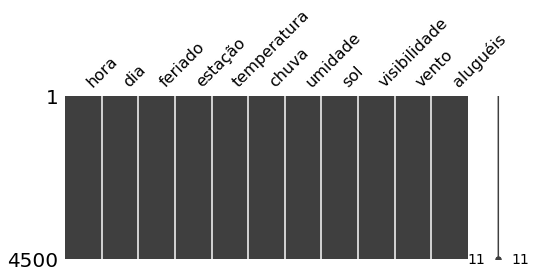

In [ ]:

msno.matrix(df_train,figsize=(8,3))

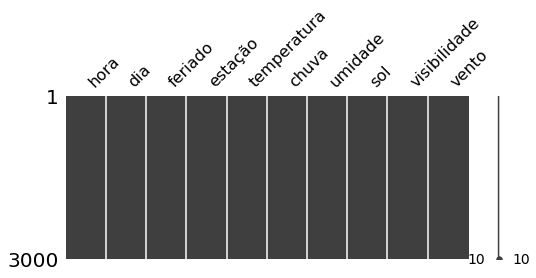

In [ ]:
msno.matrix(df_test,figsize=(8,3))

### Outliers

**Outliers**

* Analisando os dados de aluguéis foram identificados alguns outliers
* Agrupando os dados por estação e dia, também foram identificados outliers para número de aluguéis dentre dos agrupamentos.
* Houve tentativa de tratar os outliers majorando os valores de aluguéis nos grupos analisados.


In [ ]:
df_train['sol_cat'] = df_train['sol'].apply(lambda x: 'zero' if x == 0 else 'sol')
df_train['chuva_cat'] = df_train['chuva'].apply(lambda x: 'zero' if x == 0 else 'chuva')

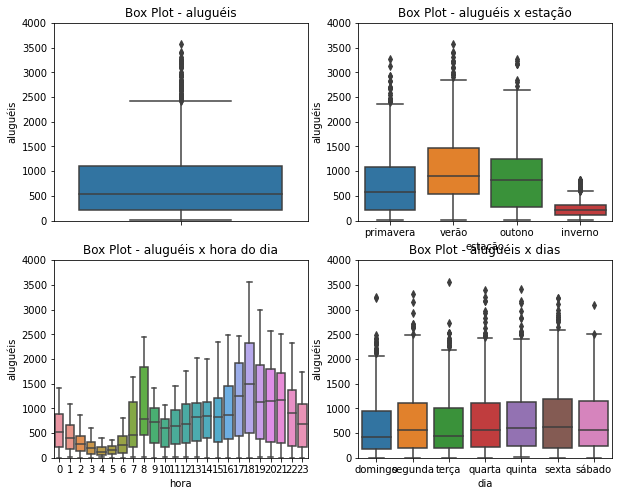

In [61]:
chart_boxplot_show(df_train
             , lst_vars=[{'y': 'aluguéis', 'title': "Box Plot - aluguéis"},
                         {'y': 'aluguéis', 'x': 'estação', 'order': ["primavera", "verão", 'outono', 'inverno'], 'title': "Box Plot - aluguéis x estação"},
                         {'y': 'aluguéis', 'x': 'hora', 'title': "Box Plot - aluguéis x hora do dia"},
                        #  {'y': 'aluguéis', 'x': 'feriado', 'title': "Box Plot - aluguéis x Feriados"},
                         {'y': 'aluguéis', 'x': 'dia', 'order': ["domingo", "segunda", 'terça', 'quarta', 'quinta', 'sexta', 'sábado'], 'title': "Box Plot - aluguéis x dias"},
                        #  {'y': 'aluguéis', 'x': 'temperatura_cat', 'title': "Box Plot - aluguéis x temp_cat"},
                        # {'y': 'aluguéis', 'x': 'sol_cat', 'title': "Box Plot - aluguéis x temp_cat"},
                         
                         
                         ]
             , lim_x_max=(0, 4000)
             )

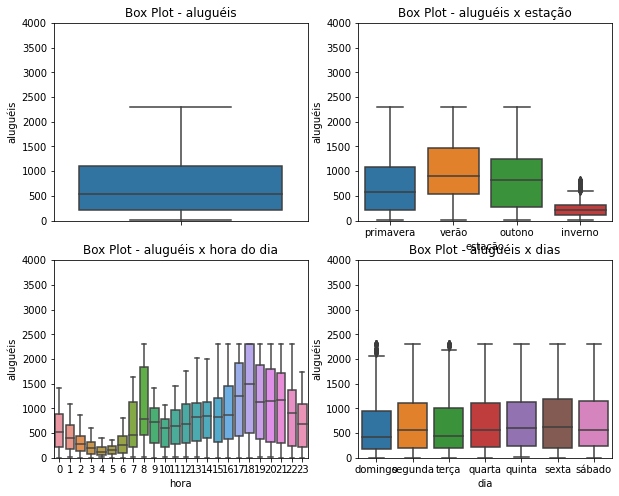

In [64]:
df_trainWithoutOutliers = df_train.copy()
df_trainWithoutOutliers = transf_fix_outliers(df_trainWithoutOutliers)

df_trainWithoutOutliers['sol_cat'] = df_trainWithoutOutliers['sol'].apply(lambda x: 'zero' if x == 0 else 'sol')
df_trainWithoutOutliers['chuva_cat'] = df_trainWithoutOutliers['chuva'].apply(lambda x: 'zero' if x == 0 else 'chuva')

chart_boxplot_show(df_trainWithoutOutliers
             , lst_vars=[{'y': 'aluguéis', 'title': "Box Plot - aluguéis"},
                         {'y': 'aluguéis', 'x': 'estação', 'order': ["primavera", "verão", 'outono', 'inverno'], 'title': "Box Plot - aluguéis x estação"},
                         {'y': 'aluguéis', 'x': 'hora', 'title': "Box Plot - aluguéis x hora do dia"},
                        #  {'y': 'aluguéis', 'x': 'feriado', 'title': "Box Plot - aluguéis x Feriados"},
                         {'y': 'aluguéis', 'x': 'dia', 'order': ["domingo", "segunda", 'terça', 'quarta', 'quinta', 'sexta', 'sábado'], 'title': "Box Plot - aluguéis x dias"},
                        #  {'y': 'aluguéis', 'x': 'temperatura_cat', 'title': "Box Plot - aluguéis x temp_cat"},
                        # {'y': 'aluguéis', 'x': 'sol_cat', 'title': "Box Plot - aluguéis x temp_cat"},
                         
                         
                         ]
             , lim_x_max=(0, 4000)
             )


### Correlation + Scatter

 **Correlação entre variáveis**
* Correlação positiva: temperatura, hora, sol, visibilidade, vento, estação, dia, feriado
* Correlação negativa: umidade, chuva
* Variáveis com maior correlação com a variável dependente: temperatura, hora, sol, umidade, visibilidade, estação


In [ ]:
df_train, df_test = mk_dataset_refresh()

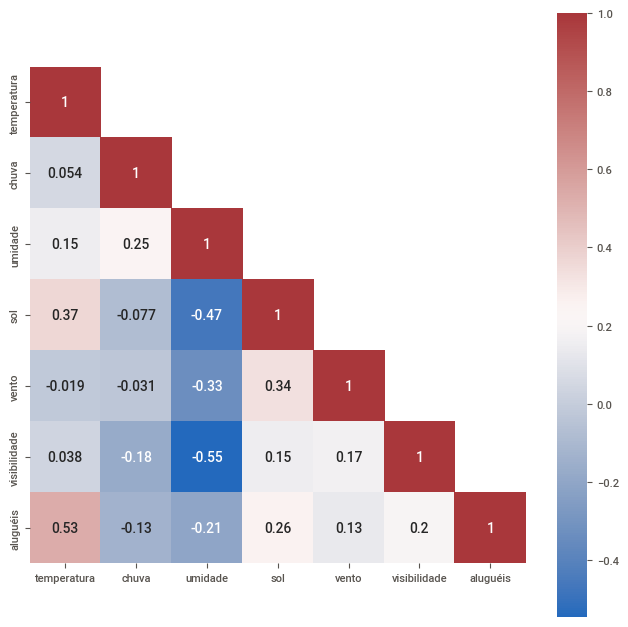

In [ ]:
corrMatt = df_train[["temperatura","chuva","umidade","sol","vento", "visibilidade", "aluguéis"]].corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(8,8)

sn.heatmap(corrMatt, mask=mask, square=True, annot=True, cmap=sn.color_palette("vlag", as_cmap=True))#"YlGnBu")

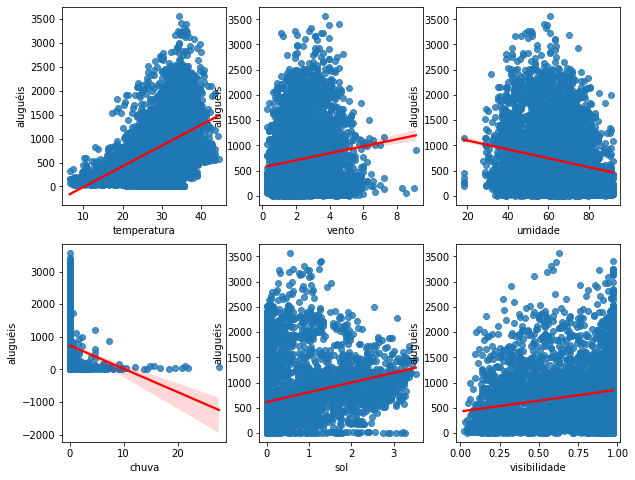

In [66]:

Distribuição de pontos <var. numérica> x aluguéis
Correlação positiva: temperatura, vento, hora, sol, visibilidade
Correlação negativa: umidade, chuva
'''
plot_scatter(df_train)

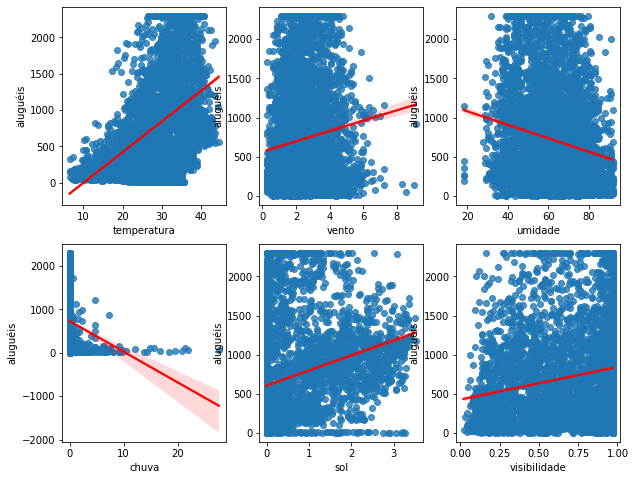

In [67]:
plot_scatter(df_trainWithoutOutliers)

### Target transformation

**Transformações na variável resposta**

* Avaliação de transformação dos valores da variável resposta com função logarítmica. Pela análise gráfica, não se percebeu  melhorias evidentes. 

* Como os dados da variável target apresentam uma curva diferente de uma normal, inclusive com uma "cauda longa", avaliou-se a possibilidade de aplicação de uma transformação logarítmica na variável resposta.

* Pela análise gráfica, não se percebe melhorias evidentes. Contudo, foram consideradas essas transformações com modelos de configurações a serem  testadas no treinamento dos modelos de machine learning.




/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


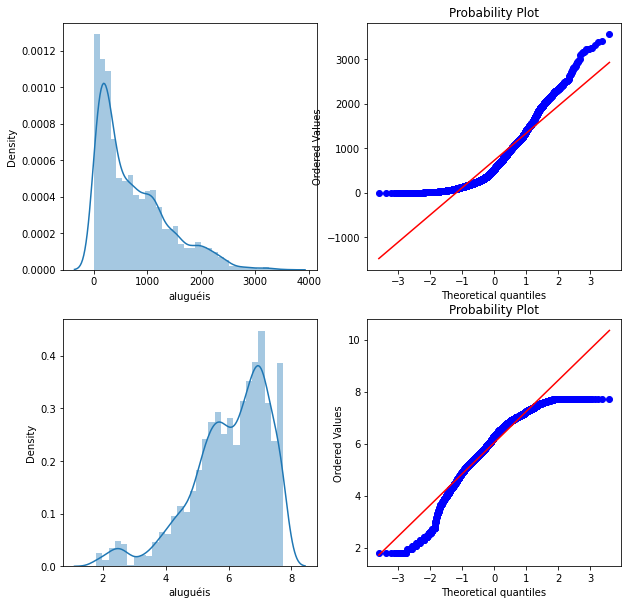

In [72]:

fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(10, 10)
sn.distplot(df_train["aluguéis"], ax=axes[0][0]);
stats.probplot(df_train["aluguéis"], dist='norm', fit=True, plot=axes[0][1]);

sn.distplot(np.log1p(df_trainWithoutOutliers["aluguéis"]), ax=axes[1][0]);
stats.probplot(np.log1p(df_trainWithoutOutliers["aluguéis"]), dist='norm', fit=True, plot=axes[1][1]);

### Data analysis: aluguéis x hora x _(other feature)_


**Cruzamento de dados: Análises**

* Distribuição média de aluguéis ao longo do dia mostra que há aluguéis nas 24 horas do dia.   
    * A partir das 5h00 há um aumento do número de aluguéis, chegando num primeiro pico às 8h00. 
    * Depois há uma leve queda permanecendo quase que constante até às 12h00, quando o número volta subir levemente.
    * A partir ds 16h00 o número aumenta significativamente até às 18h00, quando, então o número de aluguéis começa a cair de forma constante. Esse padrão final se mantém até o dia seguinte.
* Distribuição de aluguéis por estação, considerando os valores médios, apresenta uma pequena diferença, sendo que há mais aluguéis no verão, seguidos por outono e primavera. No inverno o número de aluguéis é nitidamente mais baixo.
* Na distribuição de aluguéis por estação, considerando os valores máximos, praticamente não há diferença entre os dados de verão, outono e primavera. No inverno o número máximo de aluguéis novamente é nitidamente mais baixo.

> 💡 Números mostram que os dados foram colhidos em uma região onde é comum o uso de bicicletas durante todo as 24 horas do dia.  
> 💡 O pico às 8h00 pode indicar a saída de casa para ir ao trabalho e à escola. Os picos às 16h00 e 18h00 podem indicar horário de saída de escola e trabalho, respectivamente.  
> 💡 Os dados variam pouco entre as estações de verão, outono e primavera, podem indicar que o uso de bicicleta seguem o mesmo padrão ao longo do ano, exceto no inverno.  
> ❓ Quais outros fatores poderiam influenciar o número de aluguéis mais baixo no inverno? 







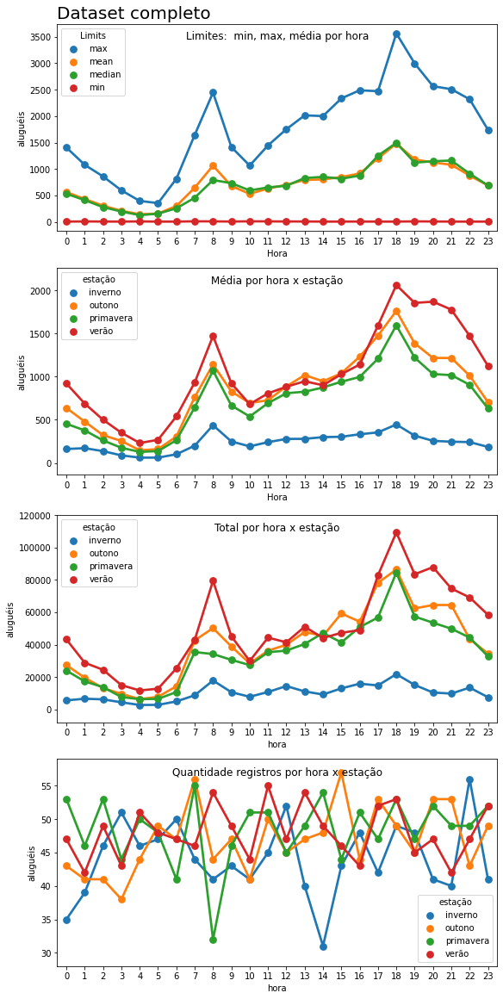

In [78]:
'''
Distribuições de aluguéis por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=False, title_additional=plot_title) #, var_aggr='sol')

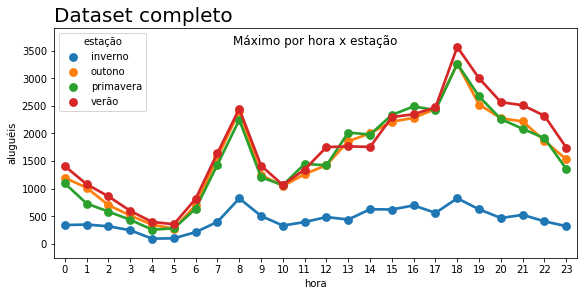

In [79]:
'''
Distribuições de aluguéis por estação (valores máximos)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='max', plot_single=True, title_additional=plot_title)

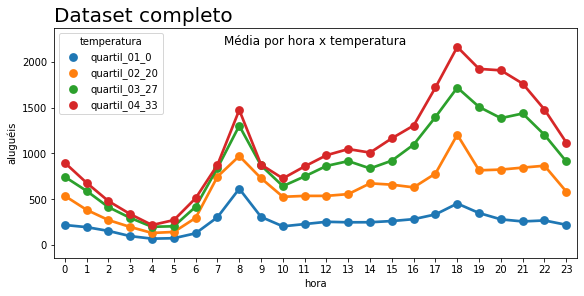

In [81]:
'''
Distribuições de aluguéis por temperatura (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train
df = transf_temperatura_cat_percent(df)

chart_plot_comp(df, 'temperatura', metric='mean', plot_single=True, title_additional=plot_title)

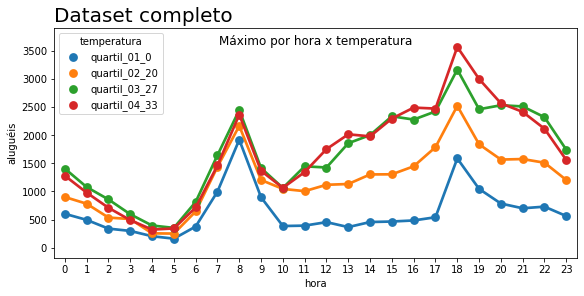

In [80]:
'''
Distribuições de aluguéis por temperatura (valores máximos)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train
df = transf_temperatura_cat_percent(df)

chart_plot_comp(df, 'temperatura', metric='max', plot_single=True, title_additional=plot_title)

#### Feature inverno: other insights

* Distribuição média de aluguéis por temperatura, separada por quartis, mostra curvas semelhantes às curvas das estações.
* Distribuição máxima de aluguéis por temperatura, separada por quartis, mostra que o pico matinal (8h00) do números de aluguéis é semelhante para qualquer temperatura, porém o pico no final do dia (18h00) varia de acordo com a temperatura, sendo que quanto mais quente, há mais alguéis.
* As temperatura registradas variam de 6.5 a 44.6º C.

> 💡 No inverno temperatura mais baixas pode influenciar negativa o número de alguéis.   
> ❓ Como o número máximo de alguéis no inverno é semelhante em torno das 8h00, porém cai significativamente nos demais horários, qual seria o motivo?

* Distribuição de alguéis por temperatura no inverno mostra comportamento semelhante entre 3h00 e 10h00. Nos demais períodos há indícios que o número de aluguéis é mais baixo quando a temperatura está mais baixa.
* Distribuições de alguéis analisadas nas demais variáveis (sol, vento, chuva, umidade, visibilidade e feriado) não permitem extrair insights significativos.




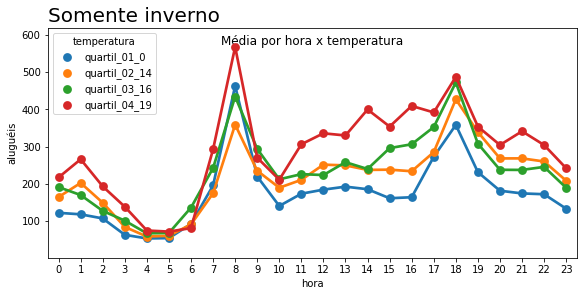

In [77]:
'''
Distribuições de aluguéis por temperatura (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_temperatura_cat_percent(df)


chart_plot_comp(df, 'temperatura', metric='mean', plot_single=True, title_additional=plot_title)

Dataset transformation: transf_create_sol_quartil


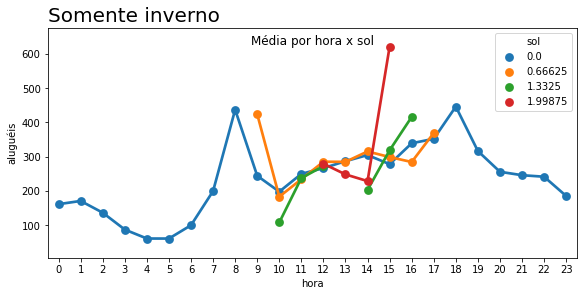

In [82]:
'''
Distribuições de aluguéis por sol (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_sol_quartil(df)

chart_plot_comp(df, 'sol', metric='mean', plot_single=True, title_additional=plot_title)

Dataset transformation: transf_create_vento_quartil


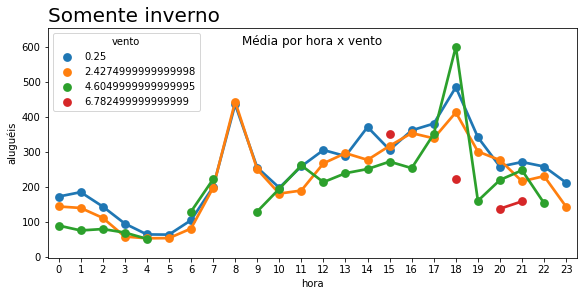

In [83]:
'''
Distribuições de aluguéis por vento (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_vento_quartil(df)

chart_plot_comp(df, 'vento', metric='mean', plot_single=True, title_additional=plot_title)

Dataset transformation: transf_create_vento_quartil


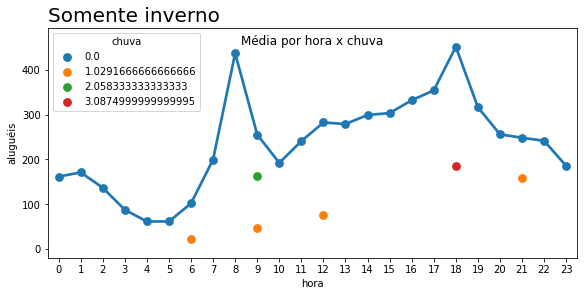

In [85]:
'''
Distribuições de aluguéis por chuva (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_chuva_quartil(df)

chart_plot_comp(df, 'chuva', metric='mean', plot_single=True, title_additional=plot_title)

Dataset transformation: transf_create_umidade_quartil


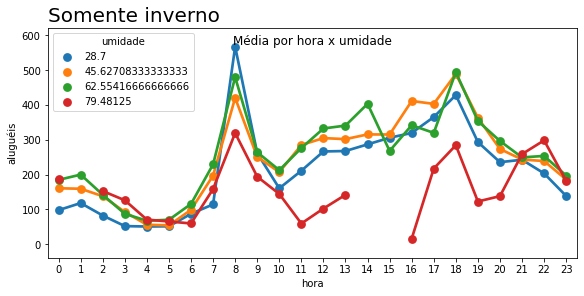

In [86]:
'''
Distribuições de aluguéis por umidade (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_umidade_quartil(df)

chart_plot_comp(df, 'umidade', metric='mean', plot_single=True, title_additional=plot_title)

Dataset transformation: transf_create_visibilidade_quartil


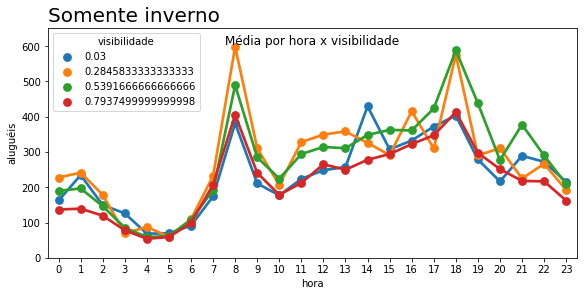

In [87]:
'''
Distribuições de aluguéis por visibilidade (valores médios) - somente inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_visibilidade_quartil(df)

chart_plot_comp(df, 'visibilidade', metric='mean', plot_single=True, title_additional=plot_title)

### Data analysis: _(other feature)_ x hora x _(other feature)_


* Distribuição de temperaturas médias por estação ao longo do dia mostra temperaturas em faixas bem definidas
	* Inverno: próxima de 15º entre 0h00 e 9h00, elevação até 19º às 17h00 e queda nos demais horários
	* Outono e primavera: próxima de 25º/26º entre 0h00 e 7h00, elevação até 30º às 15h00 e queda nos demais horários
	* Verão: próxima de 35º entre 0h00 e 6h00, elevação até 39º às 16h00 e queda nos demais horários
	
* Distribuição de intensidades solares médias (sol) por estação ao longo do dia mostra dias mais curtos no inverno e mais longos no verão. Na primavera a intensidade solar é um mais baixa comparada ao período de verão, e no outono um pouco mais baixa do que na primavera. No inverno a intensidade solar é significativamente mais baixa.
	* Inverno: próxima de 15º entre 0h00 e 9h00, elevação até 19º às 17h00 e queda nos demais horários
	* Outono e primavera: próxima de 25º/26º entre 0h00 e 7h00, elevação até 30º às 15h00 e queda nos demais horários
	* Verão: próxima de 35º entre 0h00 e 6h00, elevação até 39º às 16h00 e queda nos demais horários

> 💡 No inverno, além da temperatura influir negativamente no número de alguéis, a intensidade solar também parece influenciar negativatimente o número de aluguéis na estação.


* Distribuição de quantidade média de vento por estação ao longo do dia apresenta curvas parecidadas para todas as estações. No inverno e na primavera os valores são levemente superiores aos dados do outono e verão.

* Distribuição de quantidade de chuva por estação ao longo do dia mostra que no inverno quase não chuvas e nas demais estações chove de forma desigual durante o dia. Percebe-se que no outono há um pouco menos de chuva do que na primavera e no verão.

* Distribuição de umidade por estação ao longo do dia mostra que no inverno o tempo fica mais seco e no verão mais úmido. Na primavera e no outono a umidade apresenta características semelhantes. Em todas as estações, o dia amanhece mais úmido e se torna mais cedo até à 14h00, depois volta a umidade volta a aumentar.

* Distribuição do índice de visibilidade por estação ao longo do dia mostra que na primavera a visibilidade é um pouco menor do que nas demais estações. Talvez a combinação umidade, vento e temperatura explique  essa característica. Nas demais estações a visibilidade se mostra semelhante do longo do dia.

Text(0, 1, 'Todos os dados')
Figure(720x360)


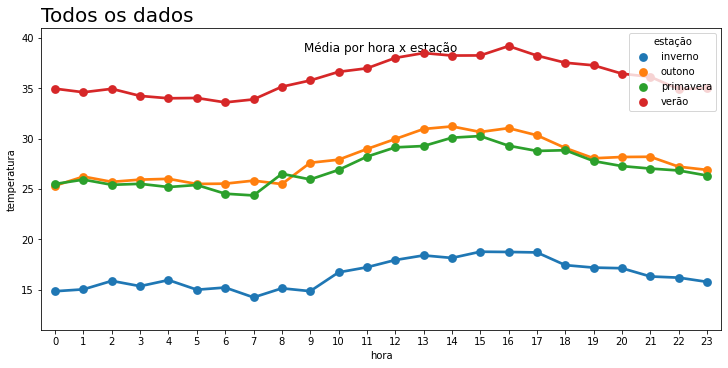

In [89]:
'''
Distribuições temperatura por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='temperatura')

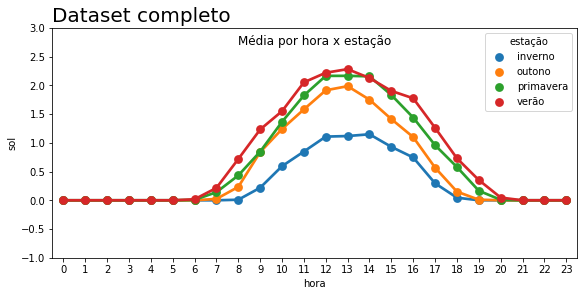

In [125]:
'''
Distribuições sol por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='sol')

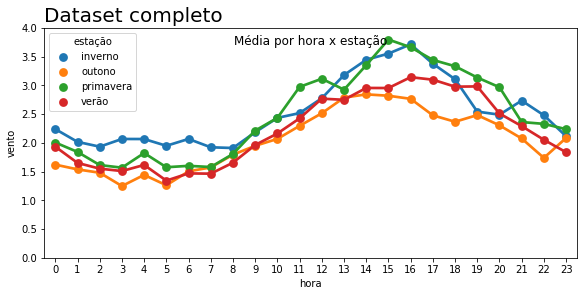

In [126]:
'''
Distribuições vento por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='vento')

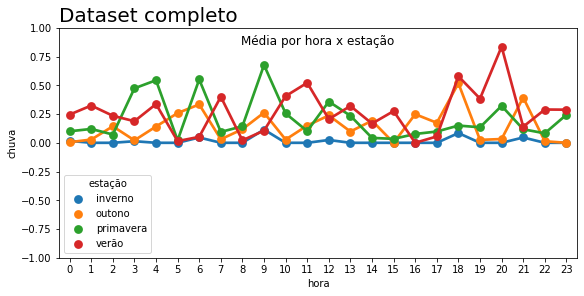

In [127]:
'''
Distribuições chuva por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='chuva')

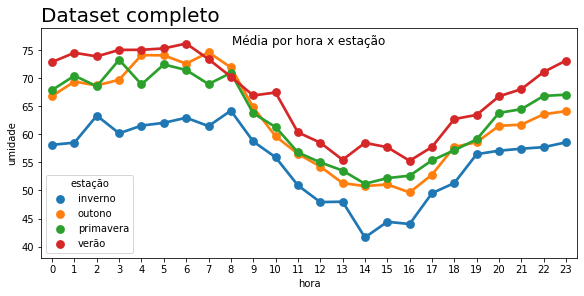

In [128]:
'''
Distribuições umidade por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='umidade')

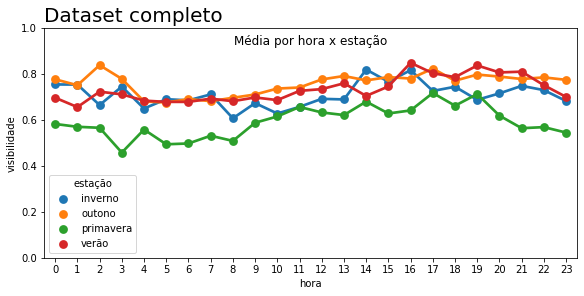

In [129]:
'''
Distribuições visibilidade por estação (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'estação', metric='mean', plot_single=True, title_additional=plot_title, var_aggr='visibilidade')

### Data analysis: feriado x dia_util

* Distribuição de aluguéis por feriado mostra um comportamentos diferentes no número de aluguéis. Nos feriados há mais alguéis entre 11h00 e 17h00, quando não é feriado há mais alguéis entre 6h00 e 11h00 e entre 17h00 e 23h00. No perído da madrugada, o número de alguéis é semelhante em todos os dias.

* Distribuição de aluguéis por dia_util mostra curvas semelhantes aos do gráfico de feriados. Dias com feriado tem comportamente semelhante de dias em finais de semana e dias sem feriado são semelhantes aos dias úteis.



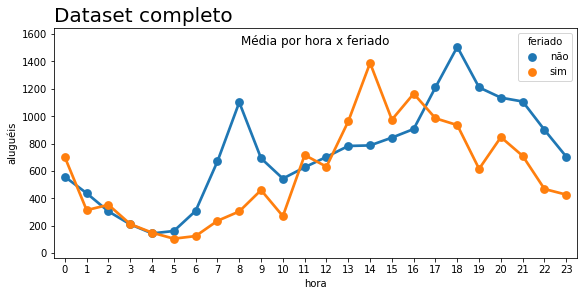

In [139]:
'''
Distribuições de aluguéis por dia_util (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

chart_plot_comp(df, 'feriado', metric='mean', plot_single=True, title_additional=plot_title) #, var_aggr='sol')

Dataset transformation: transf_create_dia_util


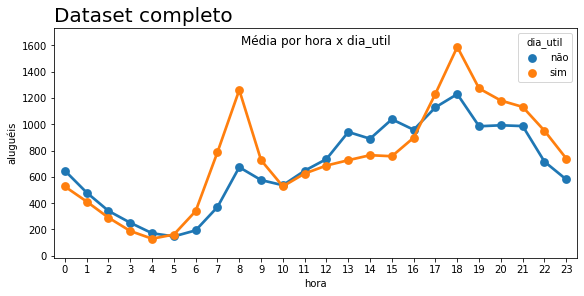

In [140]:
'''
Distribuições de aluguéis por dia_util (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = transf_create_dia_util(df)

chart_plot_comp(df, 'dia_util', metric='mean', plot_single=True, title_additional=plot_title) #, var_aggr='sol')

### Omitted data?

* Distribuição de aluguéis por estação em feriados que ocorrem na quarta mostra que, provavelmente, o dataset de treinamento contém dados de três feriados, sendo dois ocorridos no verão e um na primavera. No gráfico de quantidades de registros é possível observar que faltam vários dados.
	* Observando outros gráficos com as quantidades de registros, nota-se que em vários horários o número de registros é baixo, em relação aos número mais alto de registros.
	* O número máximo de registros por estação foi de 56, ou seja, no dataset de treinamento há registros de pelo menos 8 semanas diferentes o que equivale a 2 meses. Como uma estação do ano tem 3 meses, concluí-se que faltam pelo dados de pelo menos 1 mês.

> ❓ Qual seria o motivo vários dados não estar no dataset? Algum problema na coleta dos dados, ou os dados foram omitidos?  
> 💡 E se usando uma interpolação numérica os dados faltantes observados fossem preenchidos? Será que não seria possível reconstruir dados e ter um dataset completo daí para a previsão de novos não seria apenas uma consulta a esses dados dataset?   
> 💡 Observando a distribuição de aluguéis por hora no gráfico com os valores de mínimos e de máximos, percebe-se que há uma faixa que poderia limitar a previsão de novos valores. Esses limites de mínimo e máximos, então, poderiam ser usados para garantir que as predições não extrapolassem os valores conhecidos e, assim, contribuissem com valores menores no cálculo do RMSE.



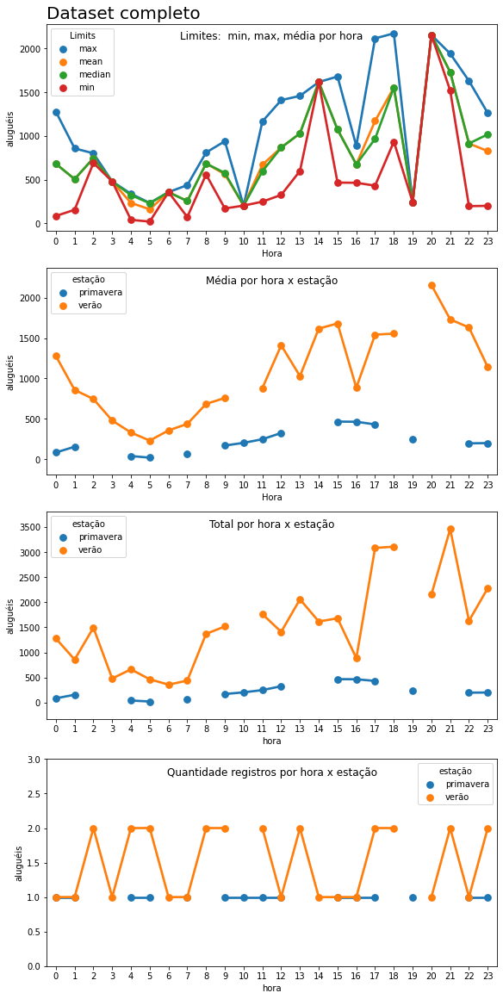

In [126]:
'''
Distribuições de aluguéis por estação em feriada na quarta (valores médios)
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df['dia'] == 'quarta')].reset_index().drop(labels='index', axis=1)
df = df[(df['feriado'] == 'sim')].reset_index().drop(labels='index', axis=1)

chart_plot_comp(df, 'estação', metric='mean', plot_single=False, title_additional=plot_title) #, var_aggr='sol')

Dataset transformation: transf_create_dia_util


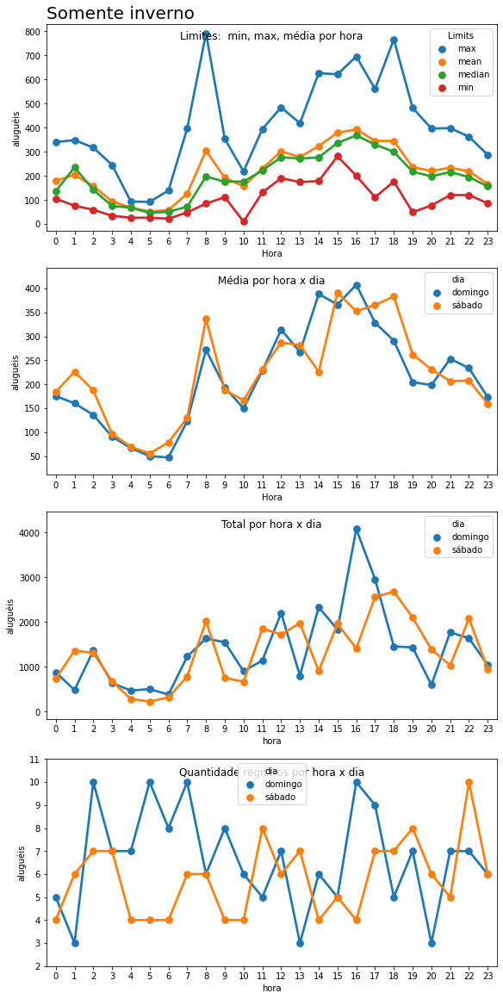

In [133]:
'''
Distribuições de aluguéis por dia em fim de semana (valores médios) - 
somente dados do inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

df = df[(df_train['estação'] == 'inverno')].reset_index().drop(labels='index', axis=1)
plot_title = "Somente inverno"

df = transf_create_dia_util(df)
df = df[(df['dia'] == 'sábado') | (df['dia'] == 'domingo')].reset_index().drop(labels='index', axis=1)
# df = df[(df['feriado'] == 'sim')].reset_index().drop(labels='index', axis=1)

chart_plot_comp(df, 'dia', metric='mean', plot_single=False, title_additional=plot_title) #, var_aggr='sol')

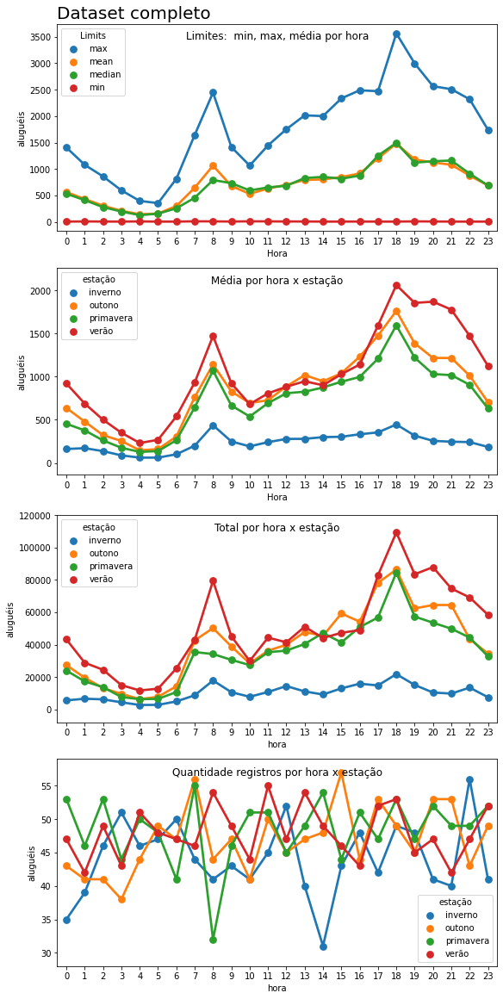

In [140]:
'''
Distribuições de aluguéis por dia em fim de semana (valores médios) - 
somente dados do inverno
'''
df_train, df_test = mk_dataset_refresh()
plot_title = "Dataset completo"
df = df_train

# df = df[(df_train['estação'] == 'primavera')].reset_index().drop(labels='index', axis=1)
# plot_title = "Somente inverno"

# df = transf_create_dia_util(df)
# df = df[(df['dia'] == 'segunda')].reset_index().drop(labels='index', axis=1)
# # df = df[(df['feriado'] == 'sim')].reset_index().drop(labels='index', axis=1)

chart_plot_comp(df, 'estação', metric='mean', plot_single=False, title_additional=plot_title) #, var_aggr='sol')

# **5.EDA - Auto viz**

## SweetViz

In [ ]:
if MK_load_EDA_modules and MK_load_EDA_modules_SweetyViz:
    !pip install sweetviz 
    import sweetviz as sv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 5.3 MB/s 


In [ ]:
'''
Tentativa de fazer imputação de dados.

Código está inativado
'''
if False:
    df_train_append_new = df_train_append 
    df_train, _ = dataset_refresh()
    df_train = df_train.append(df_train_append_new).reset_index().drop(labels='index', axis=1)

In [ ]:
df_train, df_test = dataset_refresh()

                                             |          | [  0%]   00:00 -> (? left)


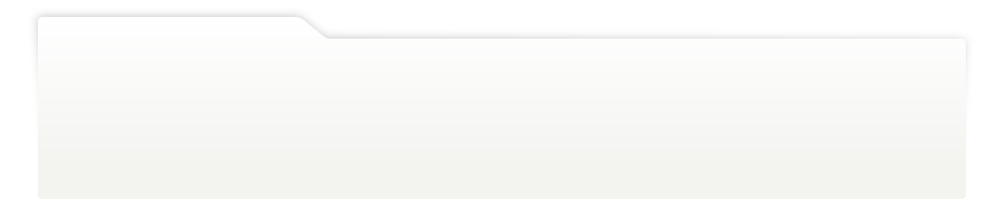
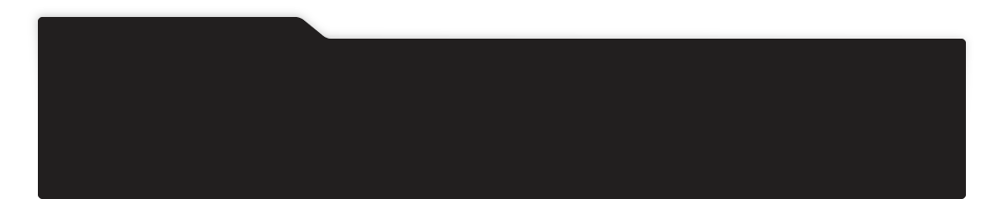
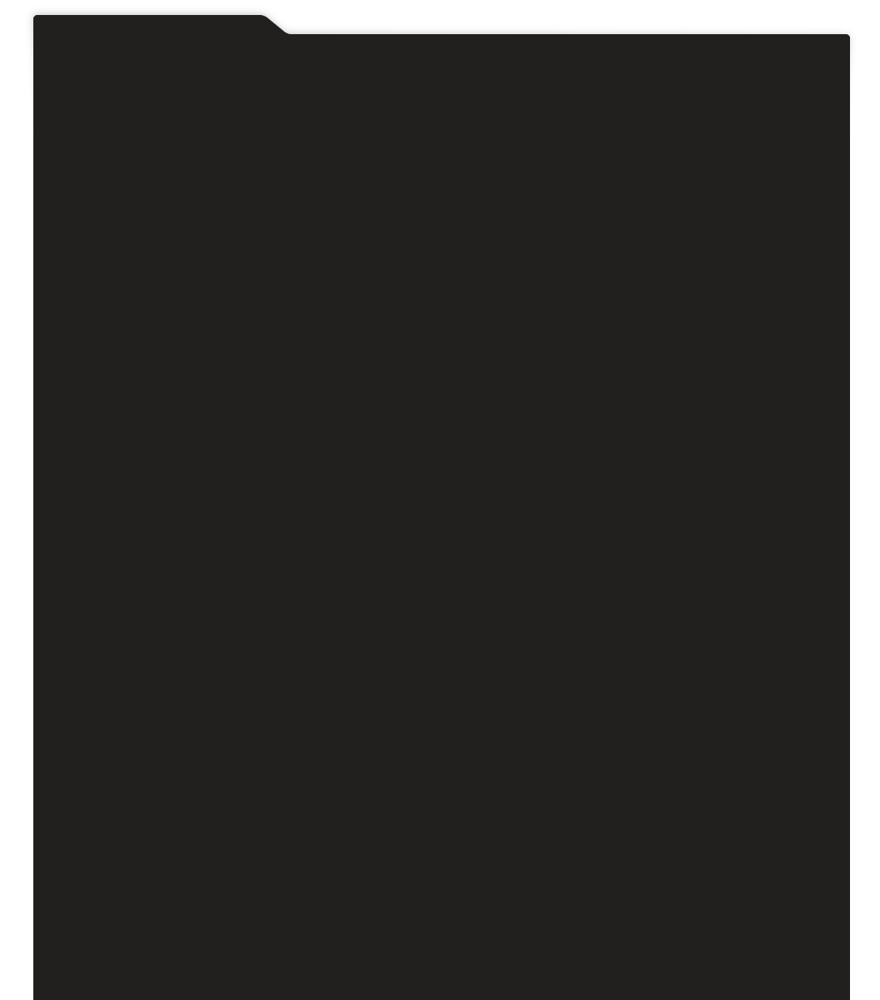
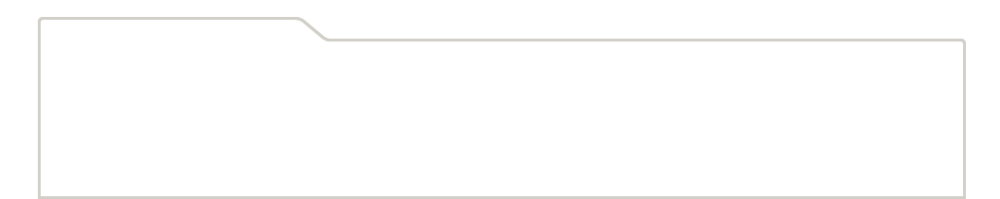
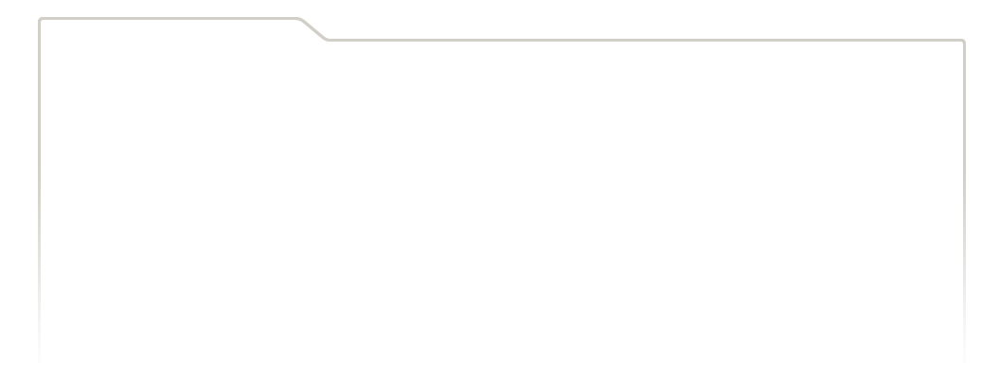
...
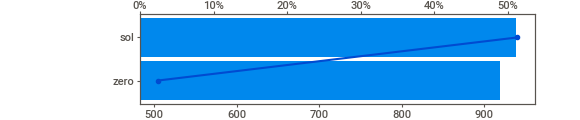
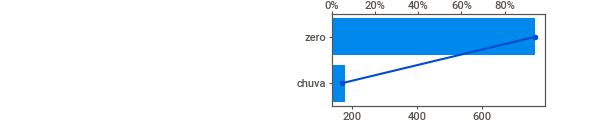
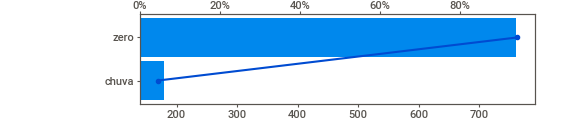
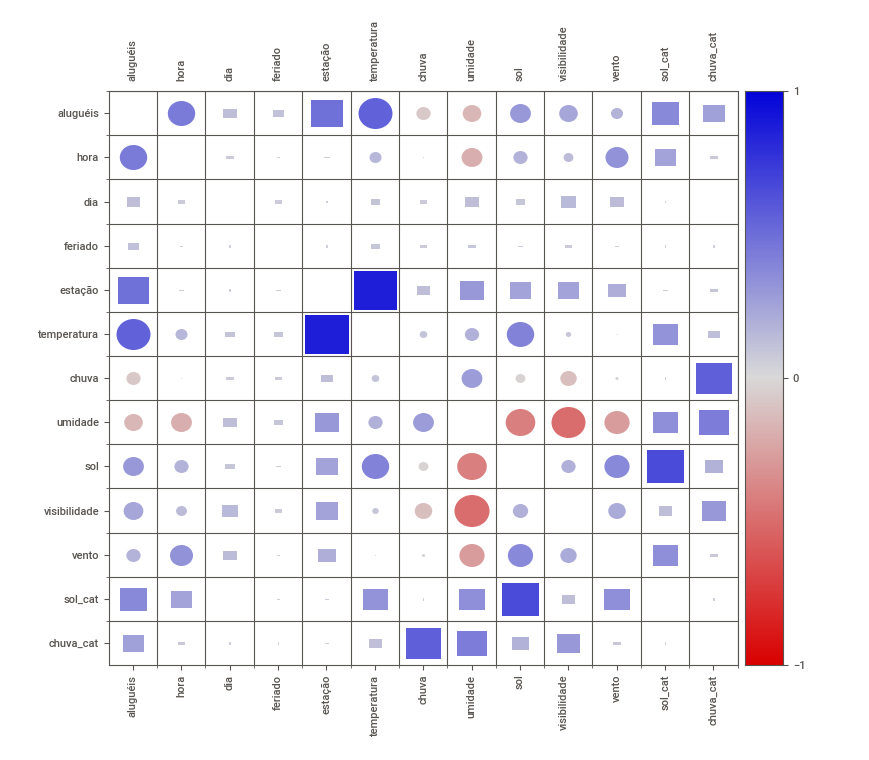
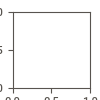

Report SweetVizAnalyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
'''
Análise do SweetViz e exportação do resultado para arquivo HTML
'''
eda = sv.analyze(source = df_train, 
                target_feat = 'aluguéis')
eda.show_notebook()
eda.show_html('SweetVizAnalyze.html')

                                             |          | [  0%]   00:00 -> (? left)


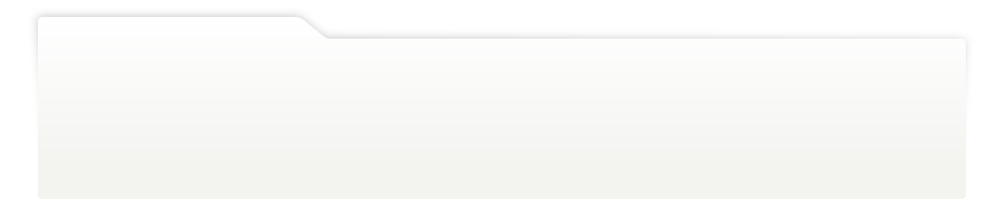
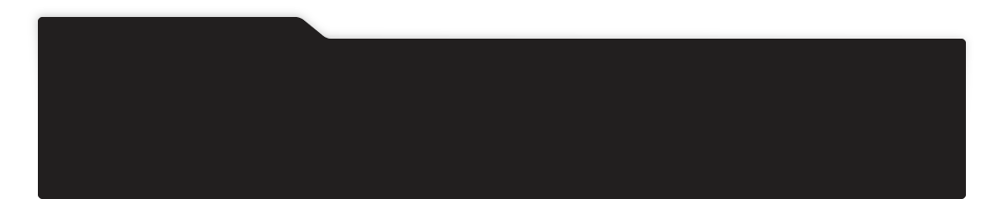
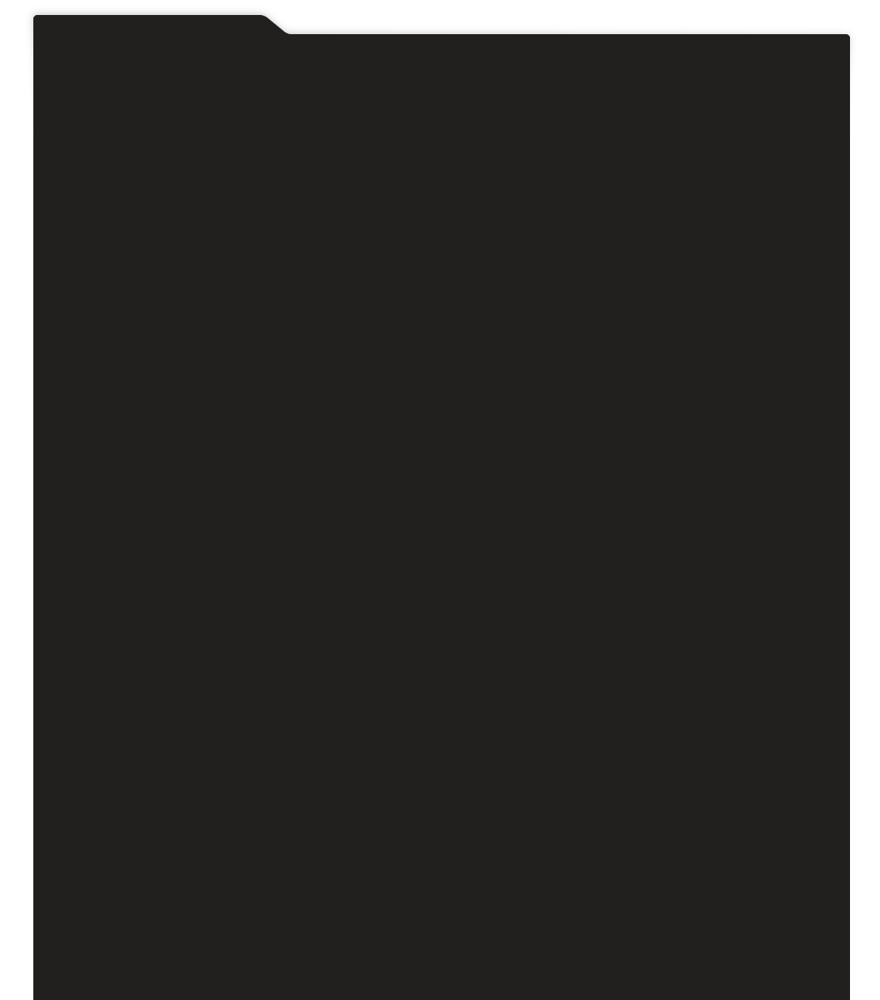
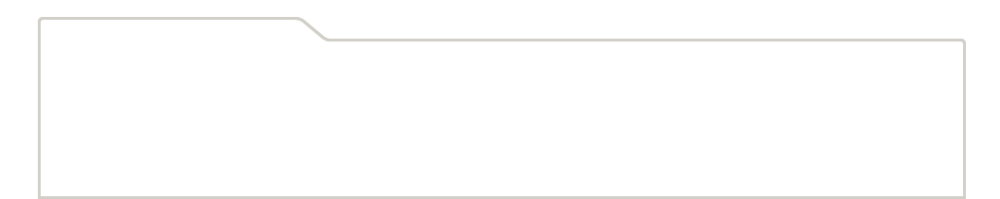
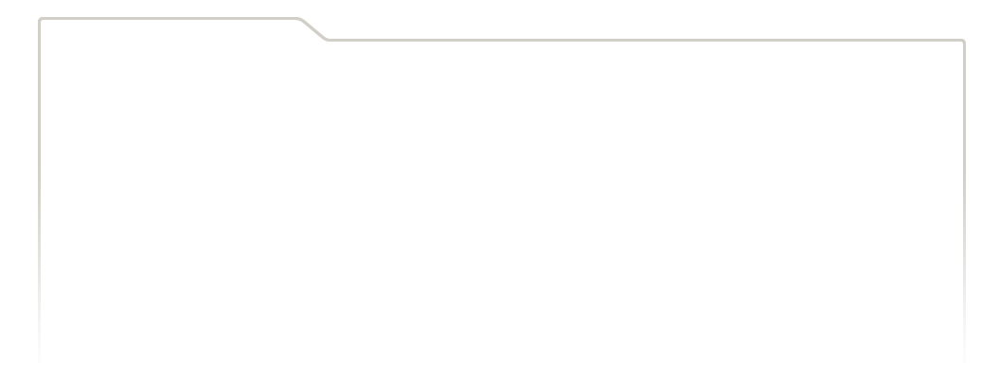
...
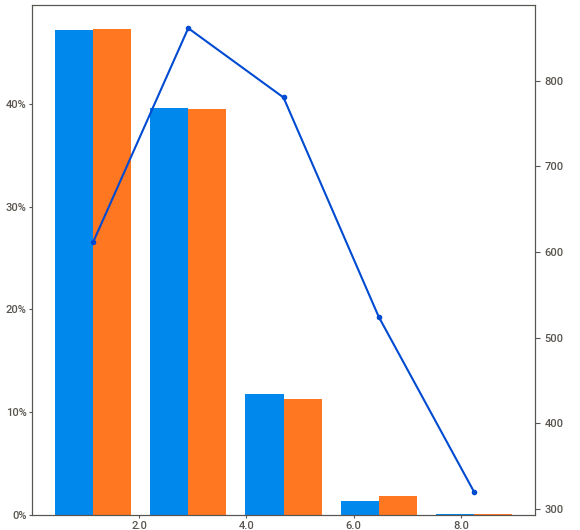
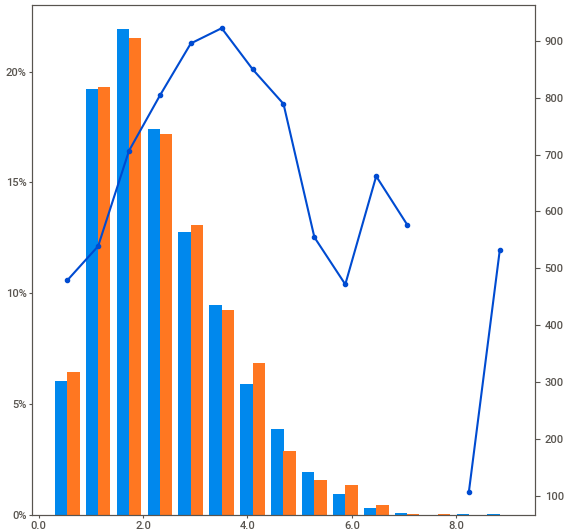
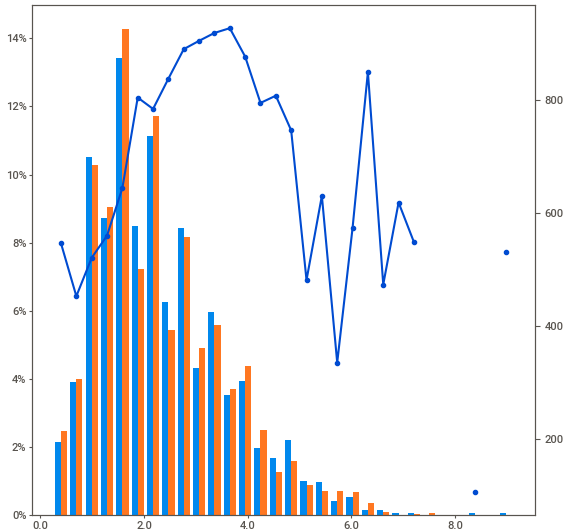
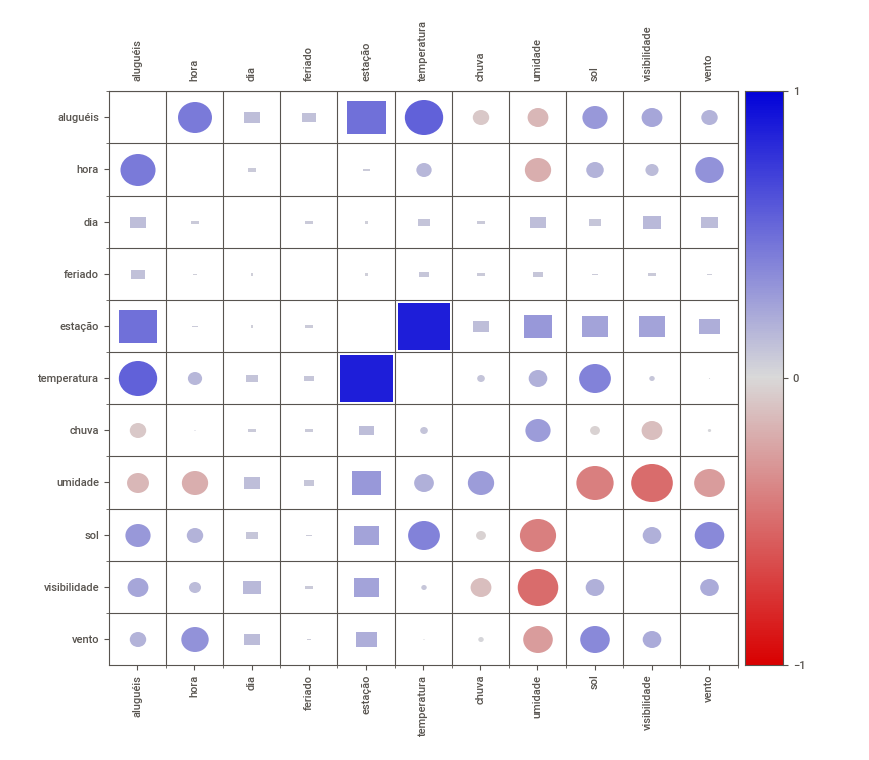
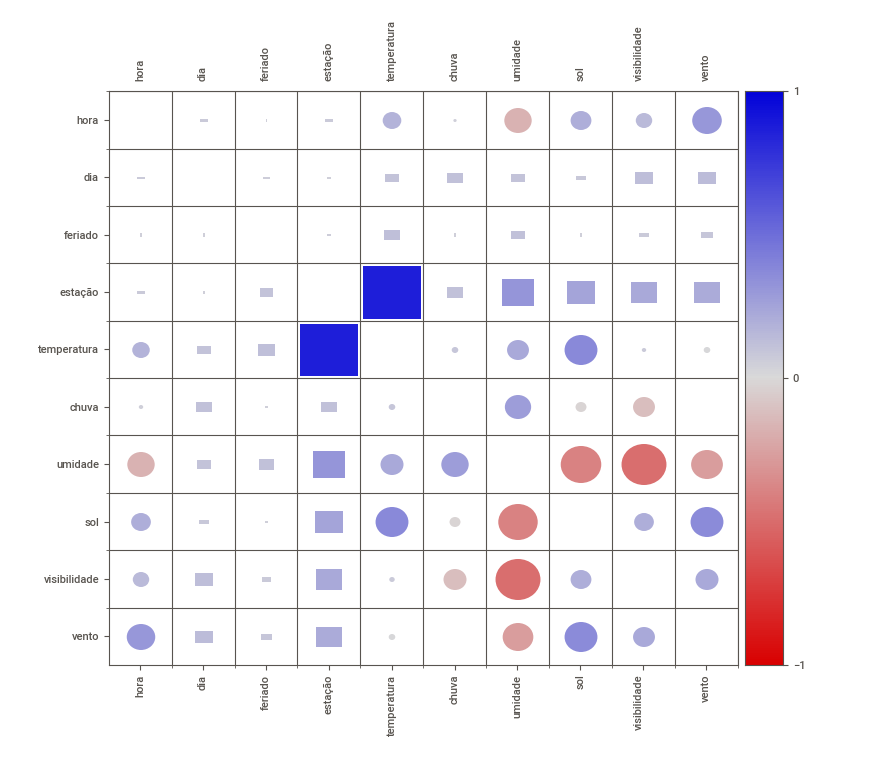

Report SweetVizCompare.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
'''
Análise do SweetViz comparando dados de treinamento e dados de teste.

Não foi feito um teste de hipótese para validar se o dados de testes poderiam 
ser usados no modelo treinamento com os dados de testes, porém, por 
uma análise de inspeção visual dos dados, percebe-se que os dados 
de treinamento e teste são parecidos.

Dessa forma, um modelo treinado com os dados de treinamento teria condições de 
fazer boas predições com os dados de testes.
'''
comparison_report = sv.compare([df_train,'Train'], [df_test,'Test'], target_feat='aluguéis')
comparison_report.show_notebook()
comparison_report.show_html('SweetVizCompare.html')

## Pandas Profiling

In [ ]:
if MK_load_EDA_modules and MK_load_EDA_modules_PandasProfiling:
    !pip install pandas-profiling==3.1.0

In [ ]:
# !pip install pandas-profiling==3.1.0

In [ ]:
# Importação das Bibliotecas
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
## Pandas Profiling Relatório
from pandas_profiling import ProfileReport

profile = ProfileReport(df_train, title='Relatório Automatizado', html={'style':{'full_width':True}})

profile.to_notebook_iframe()

profile.to_file(output_file="Relatório Automatizado.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Dataprep

Os gráficos gerados pelo 'Datapred' não foram explorados.

In [ ]:
# #Instalação do Pacote
!pip install dataprep

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.21.6-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.21.6 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
# # Relatório Automatizado
from dataprep.eda import create_report
report = create_report(df_train)
report.save('DataPrep')

Report has been saved to DataPrep.html!


## Autoviz

Os gráficos gerados pelo 'Autoviz' não foram explorados.

In [ ]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
# df = AV.AutoViz(‘heart_failure_clinical_records_dataset.csv’)
# df = AV.AutoViz(train_url, depVar='aluguéis', header=0, verbose=0,
#                 lowess=False,chart_format='html',max_rows_analyzed=150000,
#                  max_cols_analyzed=30)
df = AV.AutoViz(train_url, depVar='aluguéis', header=0, verbose=0,
                lowess=False,max_rows_analyzed=150000,
                 max_cols_analyzed=30)


Shape of your Data Set loaded: (4500, 11)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    10 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Regression problem #####################
Not able to read or load file. Please check your inputs and try again...
